<h1 style="background-color:#16DCC9;font-family:Calibri;font-size:200%;text-align:left">Proposed Solution</h1>

I will follow these steps to build a classification model with the provided dataset:

1. Data examination
    - Feature columns; missing values; target label
2. EDA
    - Univariate analysis on numerical columns and categrical columns
    - Multivariate analysis
    - Feature selection using statistical method and algorithm based method (RFECV)
3. Modeling
4. Metrics
5. Business Solutions

<a id="4"></a>
<h1 style="background-color:#16DCC9;font-family:Calibri;font-size:200%;text-align:left">Data Quality</h1>

<a id='Load_Libraries'></a>
<h2 style="color:blue">Load Libraries</h2>

In [1]:
# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

# libaries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as mno
import warnings
%matplotlib inline
plt.style.use('ggplot')

# to visualize all the columns 
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
warnings.filterwarnings("ignore")

<a id='Read_Dataset'></a>
<h2 style="color:blue">Data At a Glance</h2>

In [2]:
# load the training dataset
df = pd.read_csv('application_train.csv')

In [3]:
# shape of the dataset
df.shape

(307511, 122)

In [ ]:
# Info of the dataset
df.info()

In [ ]:
df.head()

<a id='Data_Quality'></a>
<h2 style="color:blue">Feature Description</h2>

In [177]:
# List names of all columns
df.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=122)

 Check on categorical columns

In [179]:
# Select columns with data type 'object'
object_columns = df.select_dtypes(include='object')
print(object_columns)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [162]:
object_columns.head()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
0,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,reg oper account,block of flats,"Stone, brick",No
1,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,Core staff,MONDAY,School,reg oper account,block of flats,Block,No
2,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,MONDAY,Government,NaN,NaN,NaN,NaN
3,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,NaN,NaN,NaN,NaN
4,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Core staff,THURSDAY,Religion,NaN,NaN,NaN,NaN


We have 16 categorical features.

In [163]:
object_columns.describe()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
count,307511,307511,307511,307511,306219,307511,307511,307511,307511,211120,307511,307511,97216,153214,151170,161756
unique,2,3,2,2,7,8,5,6,6,18,7,58,4,3,7,2
top,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Laborers,TUESDAY,Business Entity Type 3,reg oper account,block of flats,Panel,No
freq,278232,202448,202924,213312,248526,158774,218391,196432,272868,55186,53901,67992,73830,150503,66040,159428


count: It indicates the number of non-missing values in the "Category" column. In this case, there are 8 non-missing values.

unique: It represents the number of distinct unique values in the "Category" column. Here, we have 3 unique values: A, B, and C.

top: It displays the most frequent value in the "Category" column. The value 'A' appears most frequently.

freq: It denotes the frequency of the top value. The value 'A' occurs 3 times, making it the most frequent value in the "Category" column.

In [164]:
Check on numerical columns

SyntaxError: invalid syntax (2917536116.py, line 1)

In [165]:
# Select columns without data type 'object', in our case, it is both interger and floating data
non_object_columns = df.select_dtypes(exclude='object')

In [166]:
non_object_columns.head() # top 5 rows of numerical columns

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,1.0,2,2,10,0,0,0,0,0,0,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,0.0149,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,2.0,1,1,11,0,0,0,0,0,0,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,0.0714,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,1.0,2,2,9,0,0,0,0,0,0,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005,-3039,-9833.0,-2437,NaN,1,1,0,1,0,0,2.0,2,2,17,0,0,0,0,0,0,NaN,0.650442,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932,-3038,-4311.0,-3458,NaN,1,1,0,1,0,0,1.0,2,2,11,0,0,0,0,1,1,NaN,0.322738,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

In [11]:
non_object_columns.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 106 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41)
memory usage: 248.7 MB


In [12]:
# a quick look at numeric columns: distribution of numeric columns
non_object_columns.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,134133.000000,3.068510e+05,246546.000000,151450.00000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,159080.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,12.061091,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,2.152665,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,0.502130,5.143927e-01,0.510853,0.11744,0.088442,0.977735,0.752471,0.044621,0.078942,0.149725,0.226282,0.231894,0.066333,0.100775,0.107399,0.008809,0.028358,0.114231,0.087543,0.977065,0.759637,0.042553,0.074490,0.145193,0.222315,0.228058,0.064958,0.105645,0.105975,0.008076,0.027022,0.117850,0.087955,0.97

In [16]:
import ydata_profiling


In [18]:
from pandas_profiling import ProfileReport
profile=ProfileReport(df,minimal=True)#minimal你要全面分析就用false，基本分析就设成True
profile.to_file(output_file="output_min.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [19]:
from IPython.display import IFrame
#specify path to output_min.html file
filepath="output_min.html"
#display report in the notebook
IFrame(filepath, width=1000, height=400)

In [20]:
from pandas_profiling import ProfileReport
profile=ProfileReport(df,minimal=False)#minimal你要全面分析就用false，基本分析就设成True
profile.to_file(output_file="output_min.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [22]:
from IPython.display import IFrame
#specify path to output_min.html file
filepath="output_min.html"
#display report in the notebook
IFrame(filepath, width=1000, height=400)

In [23]:
import os

desktop_path = os.path.join(os.path.expanduser("~"), "Desktop")
print(desktop_path)

/Users/lilichen/Desktop


In [25]:
import pandas_profiling as pp

# Generate the profiling report
profile = pp.ProfileReport(df,minimal=False)

# Save the report as an HTML file
profile.to_file("data_profile.html")

# Download the file
import shutil
shutil.move("data_profile.html", "/Users/lilichen/Desktop/data_profile.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

'/Users/lilichen/Desktop/data_profile.html'

<a id='Data_Quality'></a>
<h2 style="color:blue">Missing Values</h2>

In [27]:
# Count missing values in each column
missing_counts = df.isnull().sum()

# Calculate percentage of missing values for each column
percentage_missing = (missing_counts / len(df)) * 100

# Display the results
missing_data = pd.DataFrame({'Missing Count': missing_counts, 'Percentage Missing': percentage_missing})
print(missing_data)

                              Missing Count  Percentage Missing
SK_ID_CURR                                0            0.000000
TARGET                                    0            0.000000
NAME_CONTRACT_TYPE                        0            0.000000
CODE_GENDER                               0            0.000000
FLAG_OWN_CAR                              0            0.000000
FLAG_OWN_REALTY                           0            0.000000
CNT_CHILDREN                              0            0.000000
AMT_INCOME_TOTAL                          0            0.000000
AMT_CREDIT                                0            0.000000
AMT_ANNUITY                              12            0.003902
AMT_GOODS_PRICE                         278            0.090403
NAME_TYPE_SUITE                        1292            0.420148
NAME_INCOME_TYPE                          0            0.000000
NAME_EDUCATION_TYPE                       0            0.000000
NAME_FAMILY_STATUS                      

In this code:

df represents your DataFrame.
The isnull() function checks for missing values in each column, returning a DataFrame of the same shape with boolean values indicating the presence of missing values.
The sum() function is then used to calculate the count of missing values for each column.
The len(df) returns the total number of rows in the DataFrame.
The percentage_missing calculation divides the missing counts by the total number of rows and multiplies by 100 to get the percentage.
The results are stored in a new DataFrame called missing_data, which contains two columns: "Missing Count" and "Percentage Missing".
Finally, the missing_data DataFrame is printed to display the missing count and percentage for each column.
Make sure to have the necessary libraries, such as numpy and pandas, imported before running this code.

In [ ]:
#Display the results in descending order:

In [28]:
# Count missing values in each column
missing_counts = df.isnull().sum()

# Calculate percentage of missing values for each column
percentage_missing = (missing_counts / len(df)) * 100

# Create a DataFrame with missing counts and percentage
missing_data = pd.DataFrame({'Missing Count': missing_counts, 'Percentage Missing': percentage_missing})

# Sort the DataFrame by the percentage of missing values in descending order
missing_data_sorted = missing_data.sort_values(by='Percentage Missing', ascending=False)

# Display the sorted results
print(missing_data_sorted)

                              Missing Count  Percentage Missing
COMMONAREA_MEDI                      214865           69.872297
COMMONAREA_AVG                       214865           69.872297
COMMONAREA_MODE                      214865           69.872297
NONLIVINGAPARTMENTS_MODE             213514           69.432963
NONLIVINGAPARTMENTS_AVG              213514           69.432963
NONLIVINGAPARTMENTS_MEDI             213514           69.432963
FONDKAPREMONT_MODE                   210295           68.386172
LIVINGAPARTMENTS_MODE                210199           68.354953
LIVINGAPARTMENTS_AVG                 210199           68.354953
LIVINGAPARTMENTS_MEDI                210199           68.354953
FLOORSMIN_AVG                        208642           67.848630
FLOORSMIN_MODE                       208642           67.848630
FLOORSMIN_MEDI                       208642           67.848630
YEARS_BUILD_MEDI                     204488           66.497784
YEARS_BUILD_MODE                     204

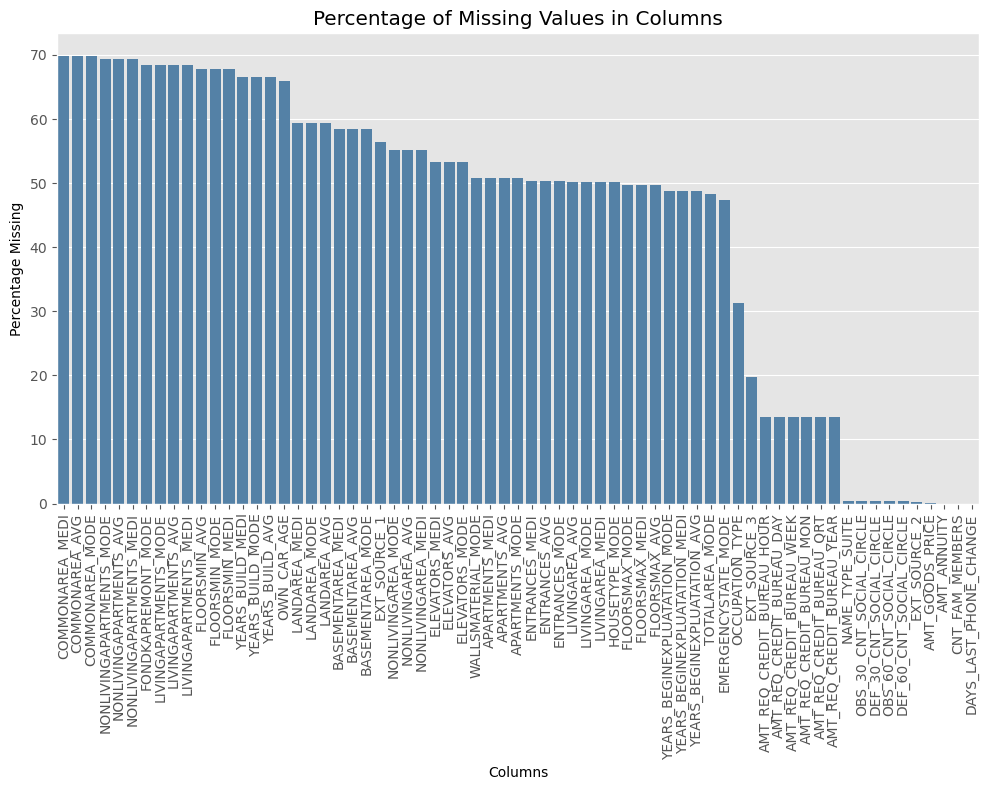

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count missing values in each column
missing_counts = df.isnull().sum()

# Calculate percentage of missing values for each column
percentage_missing = (missing_counts / len(df)) * 100

# Create a DataFrame with missing counts and percentage
missing_data = pd.DataFrame({'Missing Count': missing_counts, 'Percentage Missing': percentage_missing})

# Sort the DataFrame by the percentage of missing values in descending order
missing_data_sorted = missing_data.sort_values(by='Percentage Missing', ascending=False)

# Filter the DataFrame to include only columns with missing values
missing_data_filtered = missing_data_sorted[missing_data_sorted['Percentage Missing'] > 0]

# Plot the missing percentage
plt.figure(figsize=(10, 8))  # Increase the figure size
sns.barplot(x=missing_data_filtered.index, y=missing_data_filtered['Percentage Missing'], color='steelblue')
plt.xticks(rotation=90)
plt.xlabel('Columns')
plt.ylabel('Percentage Missing')
plt.title('Percentage of Missing Values in Columns')
plt.tight_layout()
plt.show()

In [ ]:
#Check whether missing data is MCAR or NMAR

When filling missing data, the approach can differ depending on whether the missing data is Missing Completely at Random (MCAR) or Not Missing at Random (NMAR).

MCAR (Missing Completely at Random):
MCAR implies that the probability of missingness is unrelated to both observed and unobserved data.
In this case, the missing data is considered to be randomly distributed throughout the dataset, and the missing values are not related to any specific patterns or characteristics.
To handle MCAR data, a common approach is to impute the missing values using methods such as mean imputation, median imputation, or random imputation. These methods replace the missing values with summary statistics (e.g., mean or median) or randomly sampled values from the observed data.

NMAR (Not Missing at Random):
NMAR implies that the probability of missingness depends on the unobserved data or the values of the missing variable itself.

In this case, the missing data is not randomly distributed and can be influenced by the underlying reasons for the missingness.

Handling NMAR data is more challenging as the missingness is related to the values of the missing variable. It requires careful consideration and specialized techniques.
One approach is to use advanced imputation methods designed to model and estimate the missing values based on other observed variables or patterns in the data. Examples include multiple imputation techniques, such as regression imputation, expectation-maximization imputation, or data-driven imputation methods.
In summary, the difference lies in the underlying assumptions about the missing data mechanism. If the missing data is assumed to be MCAR, simpler imputation methods can be used. However, if the missing data is NMAR, more sophisticated techniques are required to handle the missing values appropriately.

In [102]:
import pandas as pd
import numpy as np
from scipy.stats import chi2_contingency

# Load your data into a DataFrame (df)
# Replace 'your_data.csv' with the actual path to your data file
df = pd.read_csv('application_train.csv')

# Check if missing values are MCAR using chi-square test
mcar_cols = []
non_mcar_cols = []

for col in df.columns:
    missing_values = df[col].isnull().sum()
    observed_values = df[col].notnull().sum()
    total_values = len(df)
    
    if missing_values == 0:
        continue
    elif missing_values == total_values:
        non_mcar_cols.append(col)
    else:
        # Create a contingency table
        contingency_table = pd.crosstab(index=df[col].isnull(), columns=df[col].notnull())
        
        # Perform chi-square test
        chi2, p_value, _, _ = chi2_contingency(contingency_table)
        
        # Set significance level (alpha)
        alpha = 0.05
        
        if p_value < alpha:
            non_mcar_cols.append(col)
        else:
            mcar_cols.append(col)

print("MCAR columns:", mcar_cols)
print("Non-MCAR columns:", non_mcar_cols)




MCAR columns: []
Non-MCAR columns: ['AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE', 'OWN_CAR_AGE', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE', 'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE', 'FLOORSMIN_MODE', 'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE', 'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE', 'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI', 'ELEVATORS_MEDI', 'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'FLOORSMIN_MEDI', 'LANDAREA_MEDI', 'LIVINGAPARTMENTS_MEDI', 'LIVINGAREA

In [ ]:
# check if whether numerical data missing in these column is MCAR (missing completely at random)
import sys
from scipy import stats
from scipy.stats import ttest_ind

In [114]:
import scipy.stats as stats

mcar_cols = []
non_mcar_cols = []

for col in non_object_columns:
    missing_percentages = non_object_columns[col].isnull().sum() / len(non_object_columns) * 100
    if missing_percentages == 0:
        continue
    elif missing_percentages == 100:
        non_mcar_cols.append(col)
    else:
        p_value = 1.0  # initialize p-value
        # Check MCAR by comparing original column with a column with missing 
        # values imputed using mean imputation
        col_imputed = non_object_columns[col].fillna(non_object_columns[col].mean())
        t_statistic, p_value = stats.ttest_ind(non_object_columns[col], col_imputed, equal_var=False)
        if p_value < 0.05:
            non_mcar_cols.append(col)
        else:
            mcar_cols.append(col)

print("MCAR columns:", ', '.join(mcar_cols))
print("Non-MCAR columns:", ', '.join(non_mcar_cols))





MCAR columns: AMT_ANNUITY, AMT_GOODS_PRICE, OWN_CAR_AGE, CNT_FAM_MEMBERS, EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3, APARTMENTS_AVG, BASEMENTAREA_AVG, YEARS_BEGINEXPLUATATION_AVG, YEARS_BUILD_AVG, COMMONAREA_AVG, ELEVATORS_AVG, ENTRANCES_AVG, FLOORSMAX_AVG, FLOORSMIN_AVG, LANDAREA_AVG, LIVINGAPARTMENTS_AVG, LIVINGAREA_AVG, NONLIVINGAPARTMENTS_AVG, NONLIVINGAREA_AVG, APARTMENTS_MODE, BASEMENTAREA_MODE, YEARS_BEGINEXPLUATATION_MODE, YEARS_BUILD_MODE, COMMONAREA_MODE, ELEVATORS_MODE, ENTRANCES_MODE, FLOORSMAX_MODE, FLOORSMIN_MODE, LANDAREA_MODE, LIVINGAPARTMENTS_MODE, LIVINGAREA_MODE, NONLIVINGAPARTMENTS_MODE, NONLIVINGAREA_MODE, APARTMENTS_MEDI, BASEMENTAREA_MEDI, YEARS_BEGINEXPLUATATION_MEDI, YEARS_BUILD_MEDI, COMMONAREA_MEDI, ELEVATORS_MEDI, ENTRANCES_MEDI, FLOORSMAX_MEDI, FLOORSMIN_MEDI, LANDAREA_MEDI, LIVINGAPARTMENTS_MEDI, LIVINGAREA_MEDI, NONLIVINGAPARTMENTS_MEDI, NONLIVINGAREA_MEDI, TOTALAREA_MODE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60

In [ ]:
# T test suggests that all the numerical columns are missing at random, different from the results suggested by chi square.

Checking whether data is missing at random (MCAR - Missing Completely at Random) is important because it provides insights into the nature of missing data and the potential biases it may introduce in the analysis. Here are a few reasons why checking for MCAR is necessary:

Bias assessment: If data is missing at random, the missingness is unrelated to the values of the missing data or any other observed variables. This indicates that the missing data is unlikely to introduce significant bias in the analysis.
Validity of statistical tests: When data is missing at random, the statistical tests and analyses performed on the available data are still valid and provide reliable results. This ensures the accuracy and integrity of the conclusions drawn from the analysis.
Imputation techniques: Understanding whether data is missing at random helps in selecting appropriate imputation techniques. If the missingness is not at random, certain imputation methods may introduce additional biases or inaccuracies in the imputed values.
Sensitivity analysis: Assessing the missingness mechanism allows for sensitivity analysis. By examining the impact of different assumptions about the missingness mechanism, researchers can evaluate the robustness of their findings and understand the potential influence of the missing data.
In summary, checking whether data is missing at random helps ensure the validity and reliability of the analysis results, guides the selection of appropriate imputation methods, and allows for a comprehensive assessment of biases and uncertainties associated with missing data.

In [103]:
!pip install missingno


<a id='Data_Quality'></a>
<h2 style="color:blue"> Target Values</h2>

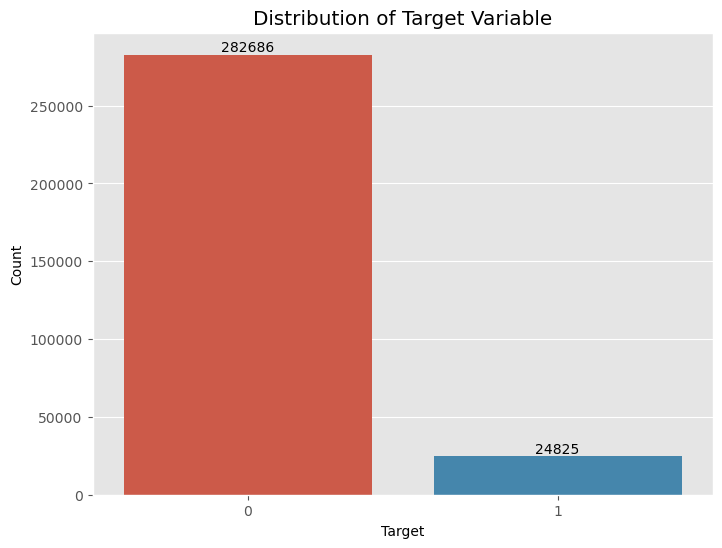

In [51]:
# To check the distribution of target values
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the distribution of the target variable
plt.figure(figsize=(8, 6))
ax = sns.countplot(x='TARGET', data=df)
plt.xlabel('Target')
plt.ylabel('Count')
plt.title('Distribution of Target Variable')

# Add count numbers on top of each bar
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')

plt.show()

This is an imbalanced data.

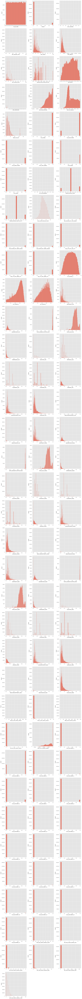

In [59]:
import matplotlib.pyplot as plt
import seaborn as sns

non_object_columns = df.select_dtypes(exclude='object')
num_cols = len(non_object_columns.columns)

# Define the number of rows and columns for subplots
num_rows = (num_cols - 1) // 3 + 1
fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5*num_rows))

# Iterate over non-object columns and plot their distributions
for i, col in enumerate(non_object_columns.columns):
    row = i // 3
    col = non_object_columns.columns[i]  # Use the column name instead of the index
    ax = axes[row, i % 3]
    sns.histplot(data=non_object_columns, x=col, ax=ax)
    ax.set_xlabel(col)
    ax.set_ylabel('Count')

# Remove empty subplots
for i in range(num_cols, num_rows * 3):
    row = i // 3
    col = i % 3
    fig.delaxes(axes[row, col])

# Adjust the layout and spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


<a id='Data_Quality'></a>
<h2 style="color:blue"> Skewness</h2>

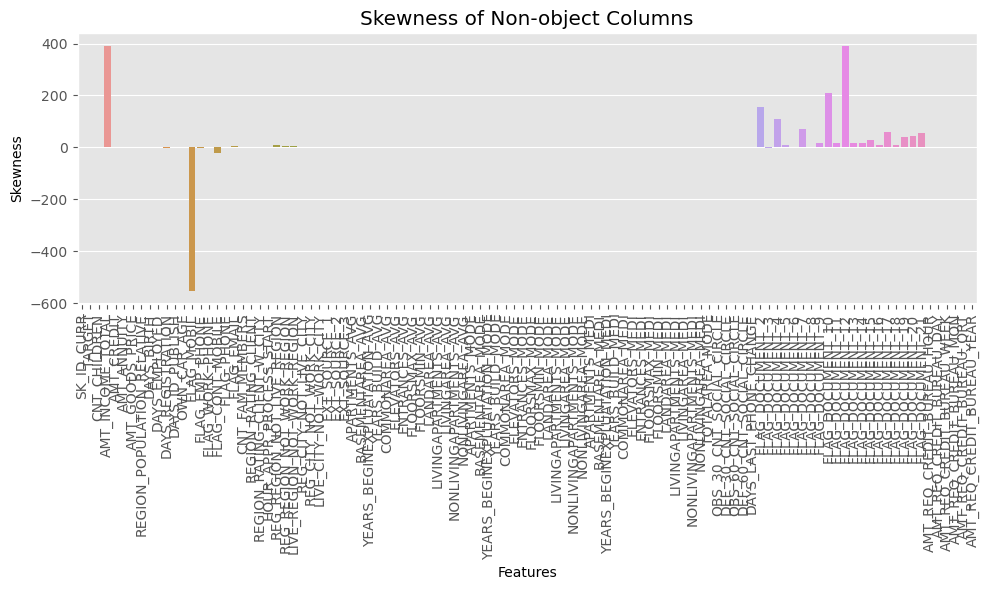

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew

non_object_columns = df.select_dtypes(exclude='object')

# Calculate the skewness for each feature
skewness = non_object_columns.apply(skew)

# Plot the skewness values
plt.figure(figsize=(10, 6))
sns.barplot(x=skewness.index, y=skewness)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Skewness')
plt.title('Skewness of Non-object Columns')
plt.tight_layout()
plt.show()


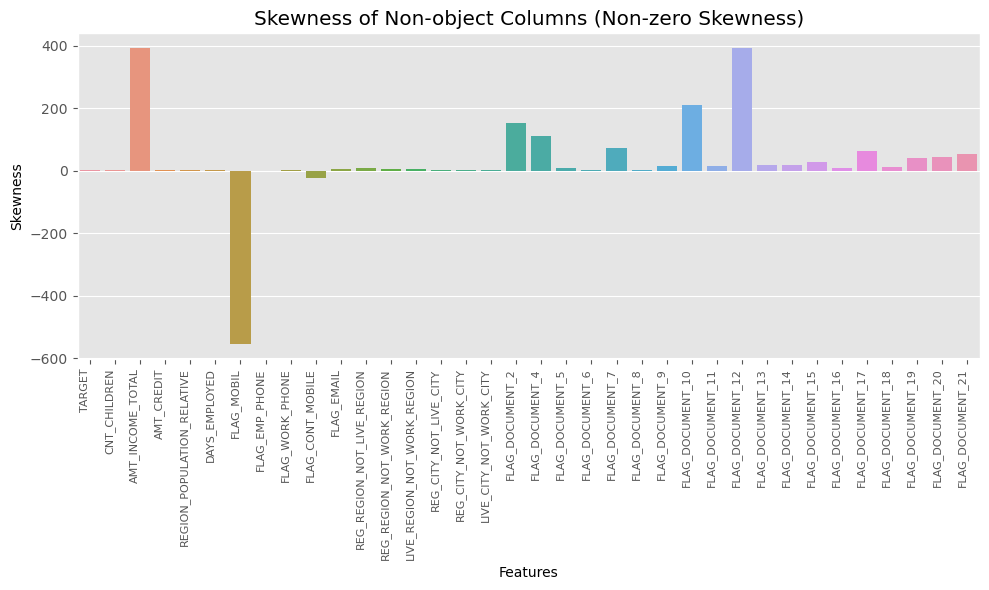

In [72]:
#To display only the data that has moderate to hight skewness (>1 or <-1)
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew

non_object_columns = df.select_dtypes(exclude='object')

# Calculate the skewness for each feature
skewness = non_object_columns.apply(skew)

# Filter the skewness data to include only non-zero skewness
skewness = skewness[skewness.abs() > 1]



# Plot the skewness values
plt.figure(figsize=(10, 6))
sns.barplot(x=skewness.index, y=skewness)
plt.xticks(rotation=90, ha='right', fontsize=8)

plt.xlabel('Features')
plt.ylabel('Skewness')
plt.title('Skewness of Non-object Columns (Non-zero Skewness)')
plt.tight_layout()
plt.show()


In machine learning, dealing with skewness in the data is often necessary to ensure that the assumptions of the models are met and to improve the model's performance. Skewed data can negatively impact the performance of certain machine learning algorithms, especially those that assume a normal or symmetric distribution of data.

There is no specific threshold value that universally determines when skewness should be addressed, as it depends on various factors such as the specific algorithm being used, the nature of the problem, and the significance of the skewness in relation to the overall data distribution. However, as a general guideline, a skewness value greater than 1 or less than -1 is often considered as an indication of moderate to high skewness.

It's important to note that the decision to address skewness should not be solely based on the magnitude of skewness coefficient. Skewness should be evaluated in the context of the problem and the specific algorithm being used. Some machine learning algorithms, such as tree-based algorithms, are less sensitive to skewness and may not require explicit treatment. On the other hand, algorithms like linear regression or neural networks may benefit from addressing skewness.

When dealing with skewness, some common techniques include:

Logarithmic transformation: Applying a logarithmic transformation (such as the natural logarithm) to the skewed feature can help reduce right skewness and make the distribution more symmetric.
Square root transformation: Taking the square root of the data can also help reduce right skewness and make the distribution closer to normal.
Box-Cox transformation: The Box-Cox transformation is a more general method that can handle a wider range of skewness. It applies a power transformation to the data, and the optimal power parameter is determined based on maximizing the log-likelihood function.
Binning/Discretization: For categorical or ordinal data, converting them into ordinal categories or bins can help reduce the impact of skewness.

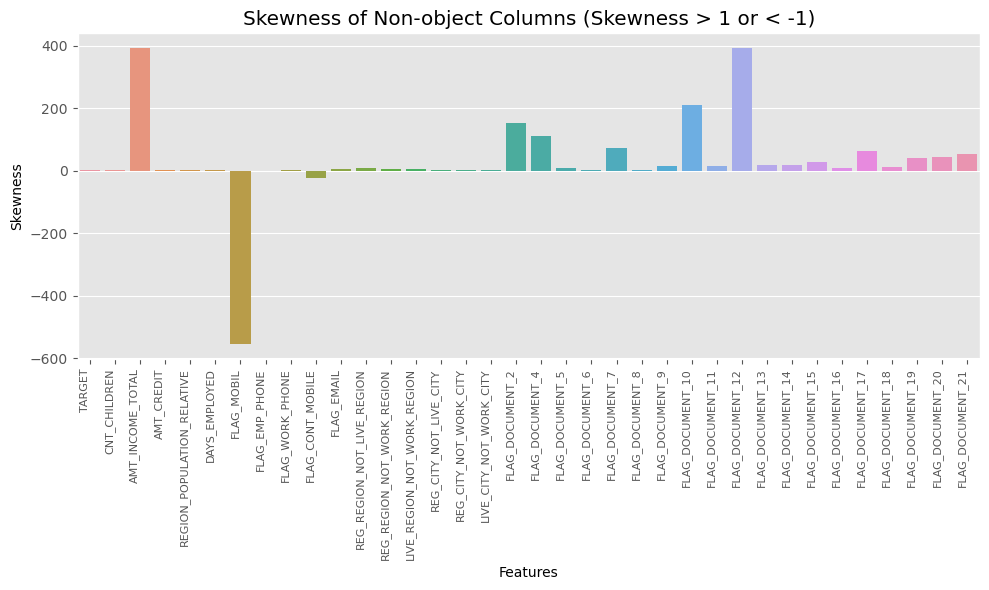

In [73]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew

non_object_columns = df.select_dtypes(exclude='object')

# Calculate the skewness for each feature
skewness = non_object_columns.apply(skew)

# Filter the skewness data to include only values with skewness greater than 1 or less than -1
skewness = skewness[(skewness > 1) | (skewness < -1)]

# Plot the skewness values
plt.figure(figsize=(10, 6))
sns.barplot(x=skewness.index, y=skewness)
plt.xticks(rotation=90, ha='right', fontsize=8)

plt.xlabel('Features')
plt.ylabel('Skewness')
plt.title('Skewness of Non-object Columns (Skewness > 1 or < -1)')
plt.tight_layout()
plt.show()

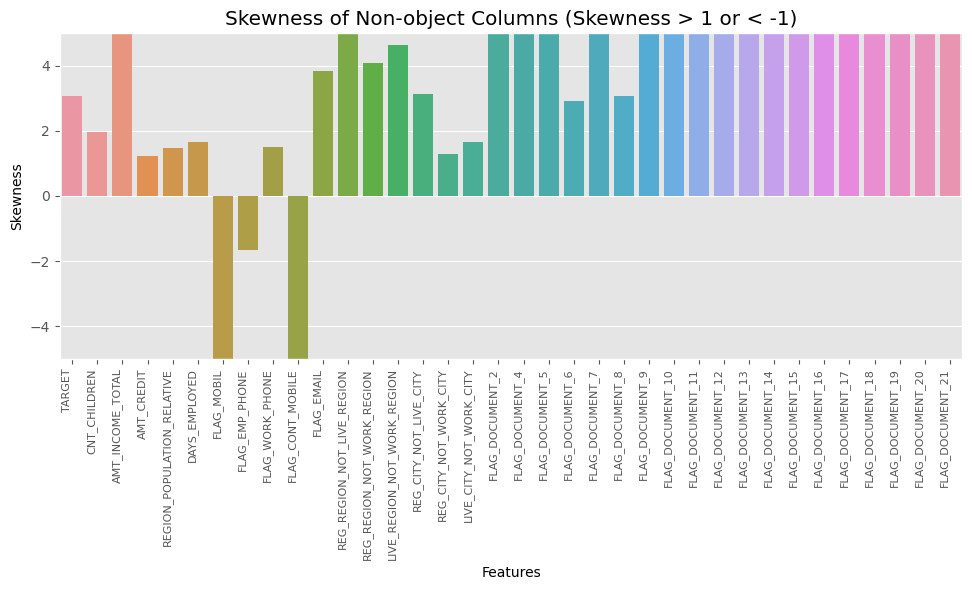

In [86]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew

non_object_columns = df.select_dtypes(exclude='object')

# Calculate the skewness for each feature
skewness = non_object_columns.apply(skew)

# Filter the skewness data to include only values with skewness greater than 1 or less than -1
skewness = skewness[(skewness > 1) | (skewness < -1)]

# Plot the skewness values
plt.figure(figsize=(10, 6))
sns.barplot(x=skewness.index, y=skewness)
plt.xticks(rotation=90, ha='right', fontsize=8)
# add dashed lines at the threshold values for moderate skewness
ax.axhline(y=1, color='red', linestyle='--')
ax.axhline(y=-1, color='red', linestyle='--')

plt.xlabel('Features')
plt.ylabel('Skewness')
plt.title('Skewness of Non-object Columns (Skewness > 1 or < -1)')
plt.tight_layout()


# Set the y-axis limits
plt.ylim(-5, 5)
plt.show()

In [74]:
#To count the number of features with skewness less than -1 or greater than 1
from scipy.stats import skew

non_object_columns = df.select_dtypes(exclude='object')

# Calculate the skewness for each feature
skewness = non_object_columns.apply(skew)

# Filter the skewness data to include only values with skewness greater than 1 or less than -1
skewed_features = skewness[(skewness > 1) | (skewness < -1)]

# Count the number of skewed features
num_skewed_features = len(skewed_features)

print("Number of features with skewness greater than 1 or less than -1:", num_skewed_features)


Number of features with skewness greater than 1 or less than -1: 36


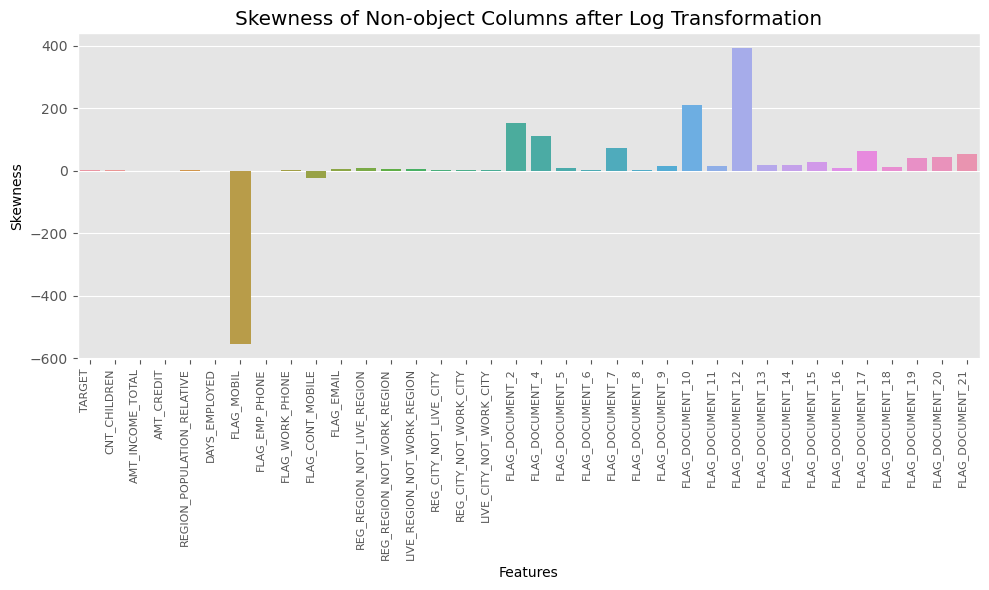

In [115]:
import numpy as np

skewed_features = skewness.index

# Apply log transformation to skewed features
for feature in skewed_features:
    if skewness[feature] > 1 or skewness[feature] < -1:
        non_object_columns[feature] = np.log1p(non_object_columns[feature])

# Plot the skewness values after log transformation
skewness_transformed = non_object_columns[skewed_features].apply(skew)

plt.figure(figsize=(10, 6))
sns.barplot(x=skewness_transformed.index, y=skewness_transformed)
plt.xticks(rotation=90, ha='right', fontsize=8)
plt.xlabel('Features')
plt.ylabel('Skewness')
plt.title('Skewness of Non-object Columns after Log Transformation')
plt.tight_layout()
plt.show()


If the skewness is less than -1 or greater than 1, the data are highly skewed.Our data has 36 features that are hight skewed.Need some transformation.

In the context of machine learning, "scipy"refers to the SciPy library, which is a powerful scientific computation library in Python. SciPy provides various modules and functions for scientific and technical computing, including optimization, linear algebra, integration, interpolation, signal and image processing, statistics, and more.

In [117]:
import numpy as np
from scipy.stats import boxcox

# Select the skewed features with skewness > 1 or < -1
skewed_features = skewness[(skewness > 1) | (skewness < -1)].index

# Apply Box-Cox transformation to the skewed features (for positive data)
for feature in skewed_features:
    if np.min(df[feature]) > 0:  # Check if data is positive
        transformed_data, lambda_param = boxcox(df[feature])
        # Update the transformed data in the DataFrame
        df[feature] = transformed_data

# Check the skewness after the Box-Cox transformation
skewness_after = df[skewed_features].apply(skew)
print(skewness_after)



TARGET                           3.078144
CNT_CHILDREN                     1.974595
AMT_INCOME_TOTAL                -0.008005
AMT_CREDIT                      -0.024068
REGION_POPULATION_RELATIVE      -0.010703
DAYS_EMPLOYED                    1.664338
FLAG_MOBIL                    -554.534039
FLAG_EMP_PHONE                  -1.664878
FLAG_WORK_PHONE                  1.504943
FLAG_CONT_MOBILE               -23.081060
FLAG_EMAIL                       3.832834
REG_REGION_NOT_LIVE_REGION       7.940238
REG_REGION_NOT_WORK_REGION       4.092747
LIVE_REGION_NOT_WORK_REGION      4.651597
REG_CITY_NOT_LIVE_CITY           3.142765
REG_CITY_NOT_WORK_CITY           1.280131
LIVE_CITY_NOT_WORK_CITY          1.669787
FLAG_DOCUMENT_2                153.791067
FLAG_DOCUMENT_4                110.893823
FLAG_DOCUMENT_5                  7.948283
FLAG_DOCUMENT_6                  2.907412
FLAG_DOCUMENT_7                 72.173756
FLAG_DOCUMENT_8                  3.062226
FLAG_DOCUMENT_9                 15

In [75]:
correlation_matrix = non_object_columns.corr()

<Axes: >

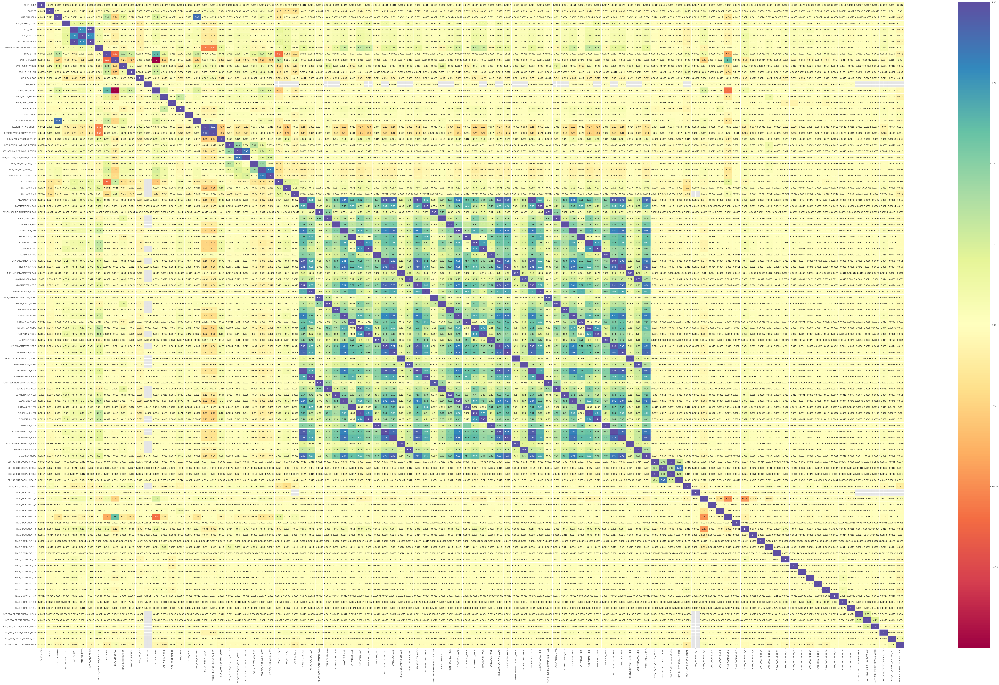

In [77]:
plt.figure(figsize=(100,60))
    
sns.heatmap(correlation_matrix,annot = True, cmap = 'Spectral',
           lw = 0.5, linecolor = 'white')

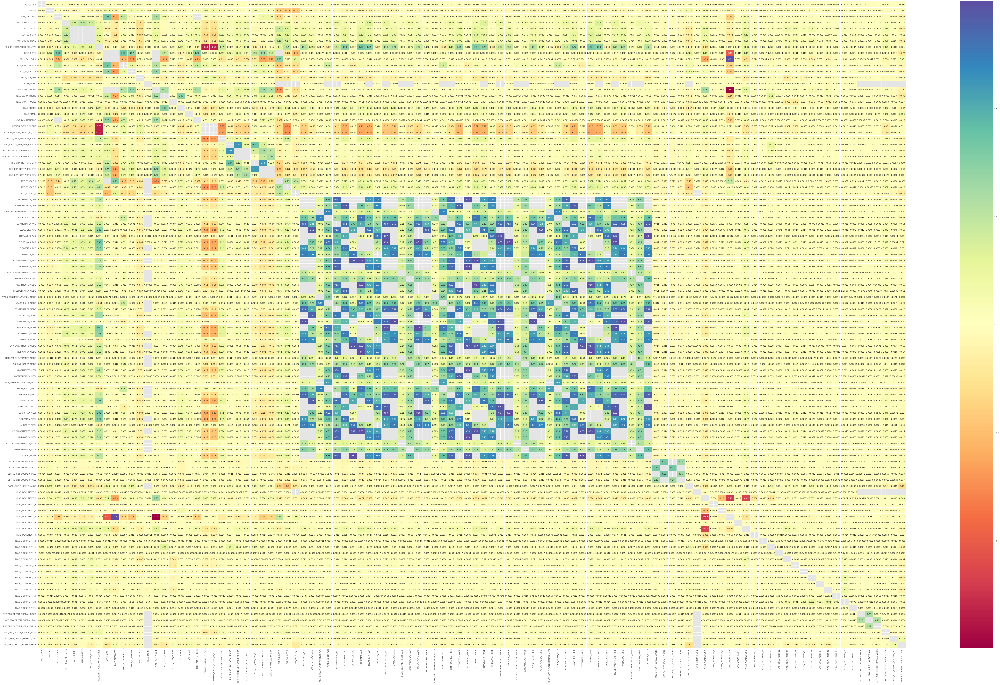

In [79]:
plt.figure(figsize=(100, 60))

# Set the threshold for significant correlations
threshold = 0.6

# Create a mask to hide insignificant correlations
mask = np.abs(correlation_matrix) >= threshold

sns.heatmap(correlation_matrix, annot=True, cmap='Spectral',
            mask=mask, lw=0.5, linecolor='white')

plt.show()


 ### PhiK analysis of categorical columns

In [118]:
from scipy import stats
import phik
from phik import resources, report### PhiK analysis of categorical columns

interval columns not set, guessing: ['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE', '

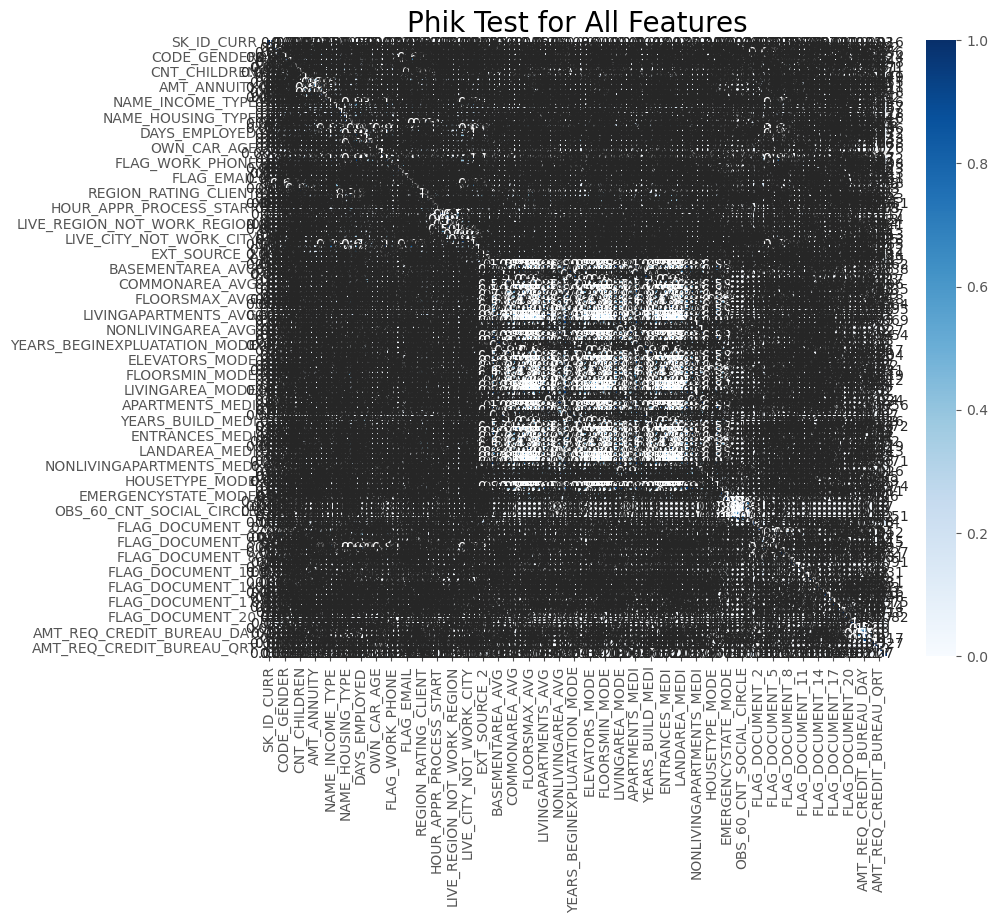

In [120]:
import phik
import matplotlib.pyplot as plt
import seaborn as sns

# Compute the Phik correlation matrix without parallelization
result = df.phik_matrix(njobs=1)

# Generate the heatmap
fig = plt.figure(figsize=(10, 8))
sns.heatmap(result, annot=True, cmap='Blues')

plt.title('Phik Test for All Features', fontsize=20)
plt.show()


The phik library provides additional correlation measures for categorical and mixed-type data.



In [132]:
# Check for columns with less than 2 unique values
cols_with_few_unique_values = [col for col in df.columns if df[col].nunique() < 2]

# Print the columns with less than 2 unique values
for col in cols_with_few_unique_values:
    print(f"Column '{col}' has less than 2 unique values.")


interval columns not set, guessing: ['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION']


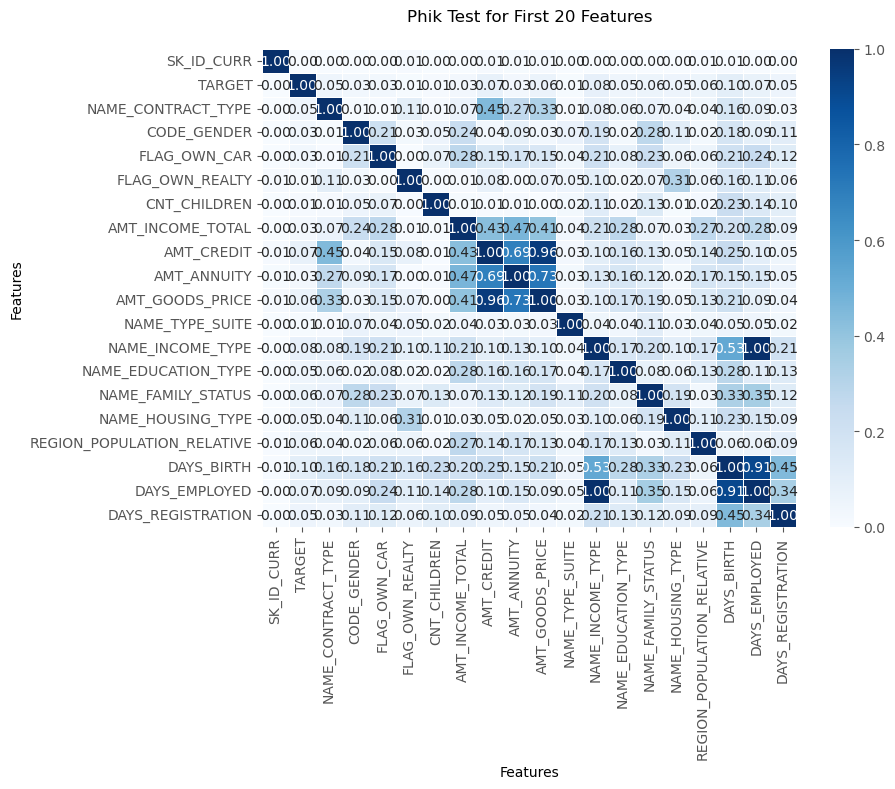

In [138]:
import phik
import matplotlib.pyplot as plt
import seaborn as sns

# Compute the Phik correlation matrix without parallelization
result = df.iloc[:, :20].phik_matrix(njobs=1)

# Set the figure size based on the number of features
num_features = len(result.columns)
fig_width = min(12, max(6, num_features * 0.5))
fig_height = min(10, max(6, num_features * 0.4))
fig, ax = plt.subplots(figsize=(fig_width, fig_height))

# Generate the heatmap
sns.heatmap(result, annot=True, cmap='Blues', fmt='.2f', ax=ax, linewidths=0.5)

# Set the x-axis and y-axis labels
ax.set_xlabel('Features', fontsize=10)
ax.set_ylabel('Features', fontsize=10)

# Set the title and adjust the position
ax.set_title('Phik Test for First 20 Features', fontsize=12, pad=20)

# Rotate the x-axis tick labels for better readability
plt.xticks(rotation=90)

# Adjust the position of the colorbar to prevent overlap with the heatmap
plt.tight_layout(rect=[0, 0, 0.95, 1])

# Save the heatmap to a file
plt.savefig('heatmap.png')

# Display the heatmap
plt.show()


interval columns not set, guessing: ['DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'TARGET']


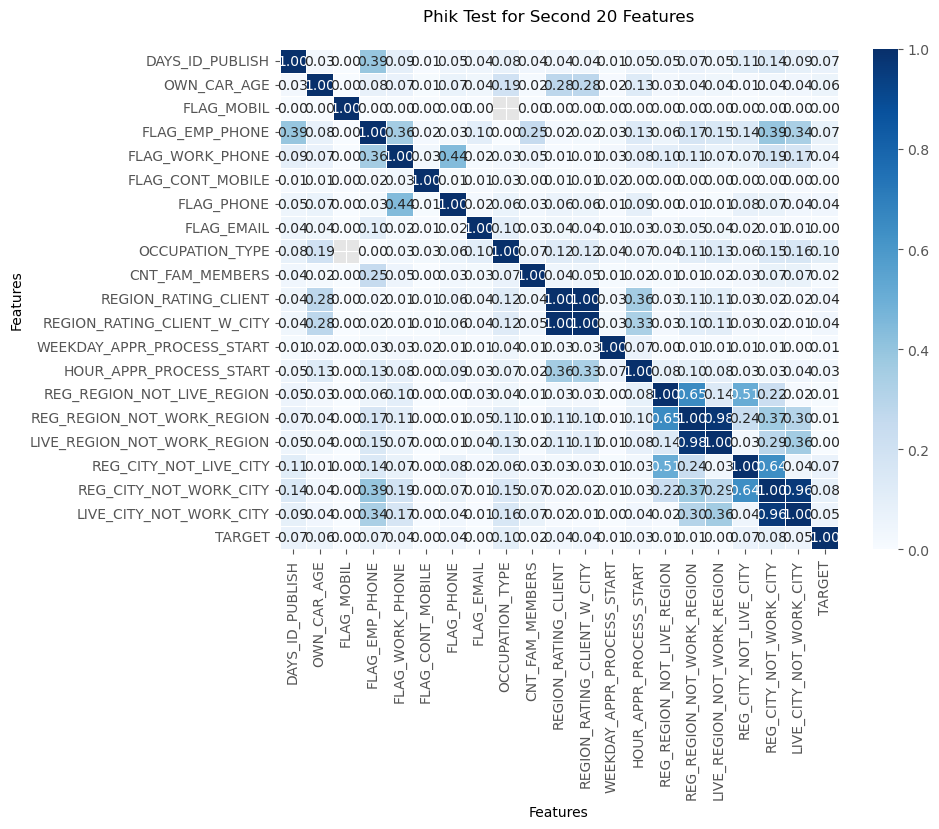

In [139]:
import phik
import matplotlib.pyplot as plt
import seaborn as sns

# Select the second 20 features from the DataFrame
selected_features = df.columns[20:40].tolist()
selected_features.append('TARGET')
selected_data = df[selected_features]

# Compute the Phik correlation matrix without parallelization
result = selected_data.phik_matrix(njobs=1)

# Set the figure size based on the number of features
num_features = len(result.columns)
fig_width = min(12, max(6, num_features * 0.5))
fig_height = min(10, max(6, num_features * 0.4))
fig, ax = plt.subplots(figsize=(fig_width, fig_height))

# Generate the heatmap
sns.heatmap(result, annot=True, cmap='Blues', fmt='.2f', ax=ax, linewidths=0.5)

# Set the x-axis and y-axis labels
ax.set_xlabel('Features', fontsize=10)
ax.set_ylabel('Features', fontsize=10)

# Set the title and adjust the position
ax.set_title('Phik Test for Second 20 Features', fontsize=12, pad=20)

# Rotate the x-axis tick labels for better readability
plt.xticks(rotation=90)

# Adjust the position of the colorbar to prevent overlap with the heatmap
plt.tight_layout(rect=[0, 0, 0.95, 1])

# Save the heatmap to a file
plt.savefig('heatmap.png')

# Display the heatmap
plt.show()


interval columns not set, guessing: ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'TARGET']


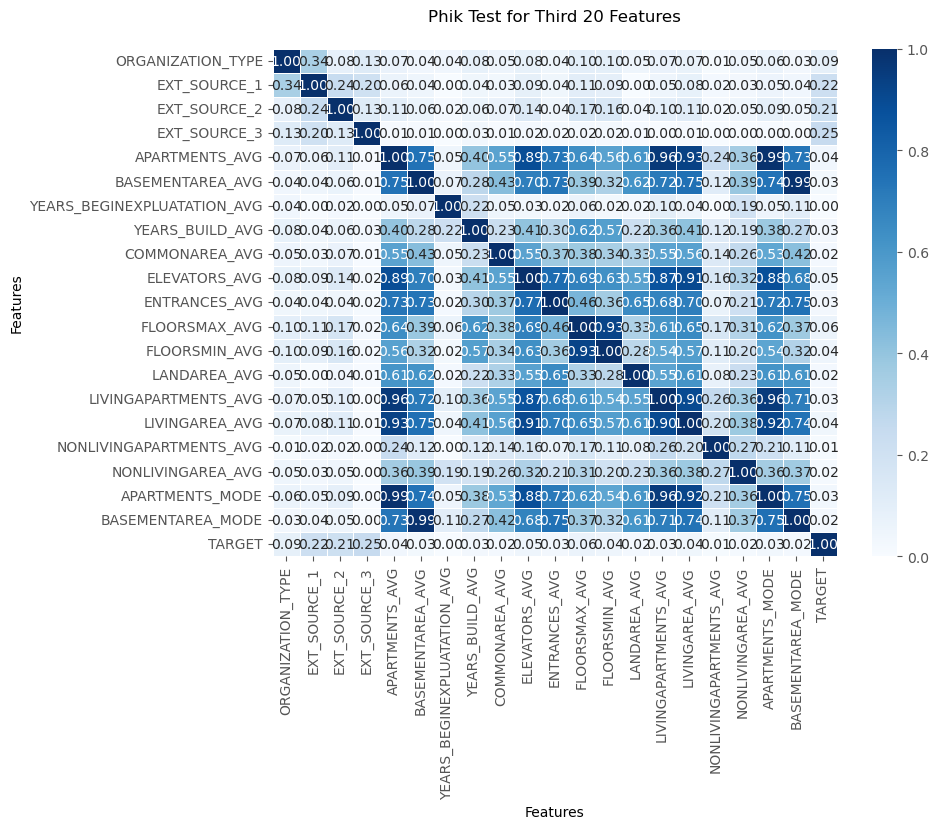

In [140]:
import phik
import matplotlib.pyplot as plt
import seaborn as sns

# Select the third 20 features from the DataFrame
selected_features = df.columns[40:60].tolist()
selected_features.append('TARGET')
selected_data = df[selected_features]

# Compute the Phik correlation matrix without parallelization
result = selected_data.phik_matrix(njobs=1)

# Set the figure size based on the number of features
num_features = len(result.columns)
fig_width = min(12, max(6, num_features * 0.5))
fig_height = min(10, max(6, num_features * 0.4))
fig, ax = plt.subplots(figsize=(fig_width, fig_height))

# Generate the heatmap
sns.heatmap(result, annot=True, cmap='Blues', fmt='.2f', ax=ax, linewidths=0.5)

# Set the x-axis and y-axis labels
ax.set_xlabel('Features', fontsize=10)
ax.set_ylabel('Features', fontsize=10)

# Set the title and adjust the position
ax.set_title('Phik Test for Third 20 Features', fontsize=12, pad=20)

# Rotate the x-axis tick labels for better readability
plt.xticks(rotation=90)

# Adjust the position of the colorbar to prevent overlap with the heatmap
plt.tight_layout(rect=[0, 0, 0.95, 1])

# Save the heatmap to a file
plt.savefig('heatmap.png')

# Display the heatmap
plt.show()


interval columns not set, guessing: ['YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE', 'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE', 'FLOORSMIN_MODE', 'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE', 'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE', 'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI', 'ELEVATORS_MEDI', 'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'TARGET']


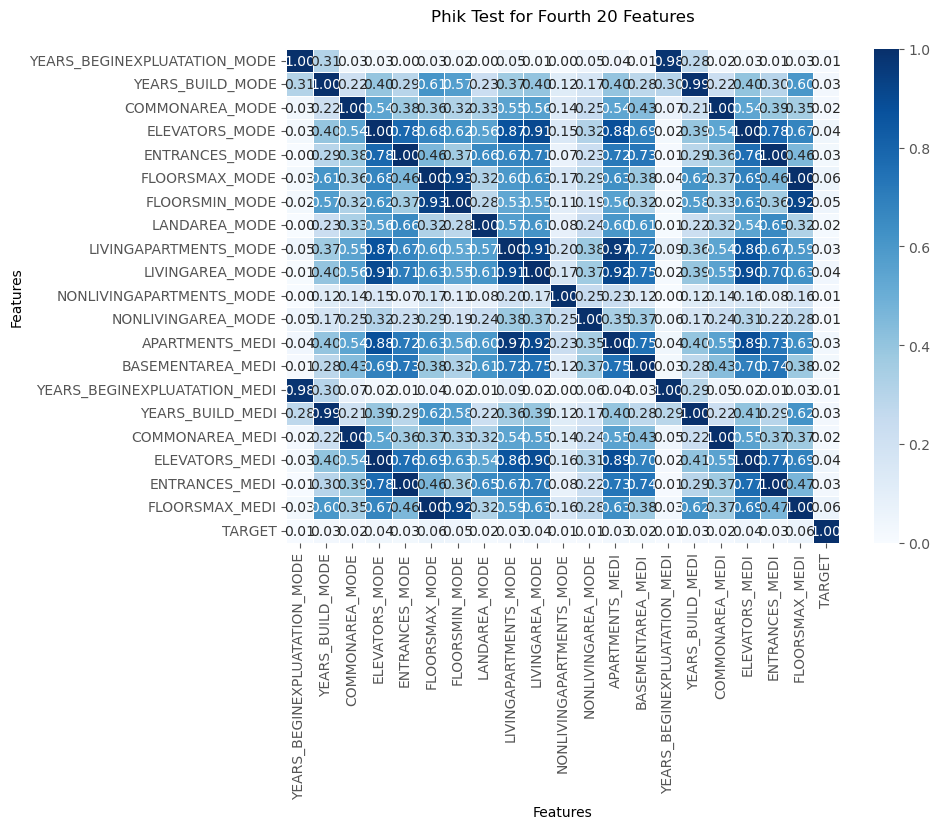

In [141]:
import phik
import matplotlib.pyplot as plt
import seaborn as sns

# Select the fourth 20 features from the DataFrame
selected_features = df.columns[60:80].tolist()
selected_features.append('TARGET')
selected_data = df[selected_features]

# Compute the Phik correlation matrix without parallelization
result = selected_data.phik_matrix(njobs=1)

# Set the figure size based on the number of features
num_features = len(result.columns)
fig_width = min(12, max(6, num_features * 0.5))
fig_height = min(10, max(6, num_features * 0.4))
fig, ax = plt.subplots(figsize=(fig_width, fig_height))

# Generate the heatmap
sns.heatmap(result, annot=True, cmap='Blues', fmt='.2f', ax=ax, linewidths=0.5)

# Set the x-axis and y-axis labels
ax.set_xlabel('Features', fontsize=10)
ax.set_ylabel('Features', fontsize=10)

# Set the title and adjust the position
ax.set_title('Phik Test for Fourth 20 Features', fontsize=12, pad=20)

# Rotate the x-axis tick labels for better readability
plt.xticks(rotation=90)

# Adjust the position of the colorbar to prevent overlap with the heatmap
plt.tight_layout(rect=[0, 0, 0.95, 1])

# Save the heatmap to a file
plt.savefig('heatmap.png')

# Display the heatmap
plt.show()


interval columns not set, guessing: ['FLOORSMIN_MEDI', 'LANDAREA_MEDI', 'LIVINGAPARTMENTS_MEDI', 'LIVINGAREA_MEDI', 'NONLIVINGAPARTMENTS_MEDI', 'NONLIVINGAREA_MEDI', 'TOTALAREA_MODE', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'TARGET']


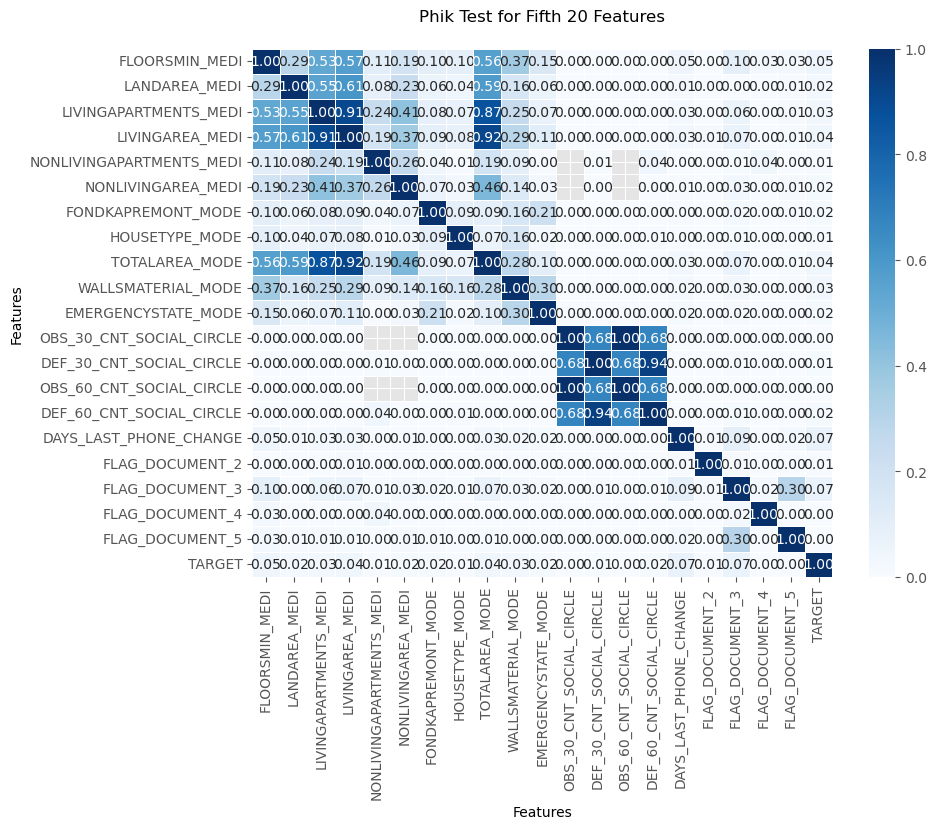

In [142]:
import phik
import matplotlib.pyplot as plt
import seaborn as sns

# Select the fifth 20 features from the DataFrame
selected_features = df.columns[80:100].tolist()
selected_features.append('TARGET')
selected_data = df[selected_features]

# Compute the Phik correlation matrix without parallelization
result = selected_data.phik_matrix(njobs=1)

# Set the figure size based on the number of features
num_features = len(result.columns)
fig_width = min(12, max(6, num_features * 0.5))
fig_height = min(10, max(6, num_features * 0.4))
fig, ax = plt.subplots(figsize=(fig_width, fig_height))

# Generate the heatmap
sns.heatmap(result, annot=True, cmap='Blues', fmt='.2f', ax=ax, linewidths=0.5)

# Set the x-axis and y-axis labels
ax.set_xlabel('Features', fontsize=10)
ax.set_ylabel('Features', fontsize=10)

# Set the title and adjust the position
ax.set_title('Phik Test for Fifth 20 Features', fontsize=12, pad=20)

# Rotate the x-axis tick labels for better readability
plt.xticks(rotation=90)

# Adjust the position of the colorbar to prevent overlap with the heatmap
plt.tight_layout(rect=[0, 0, 0.95, 1])

# Save the heatmap to a file
plt.savefig('heatmap.png')

# Display the heatmap
plt.show()


interval columns not set, guessing: ['FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR', 'TARGET']


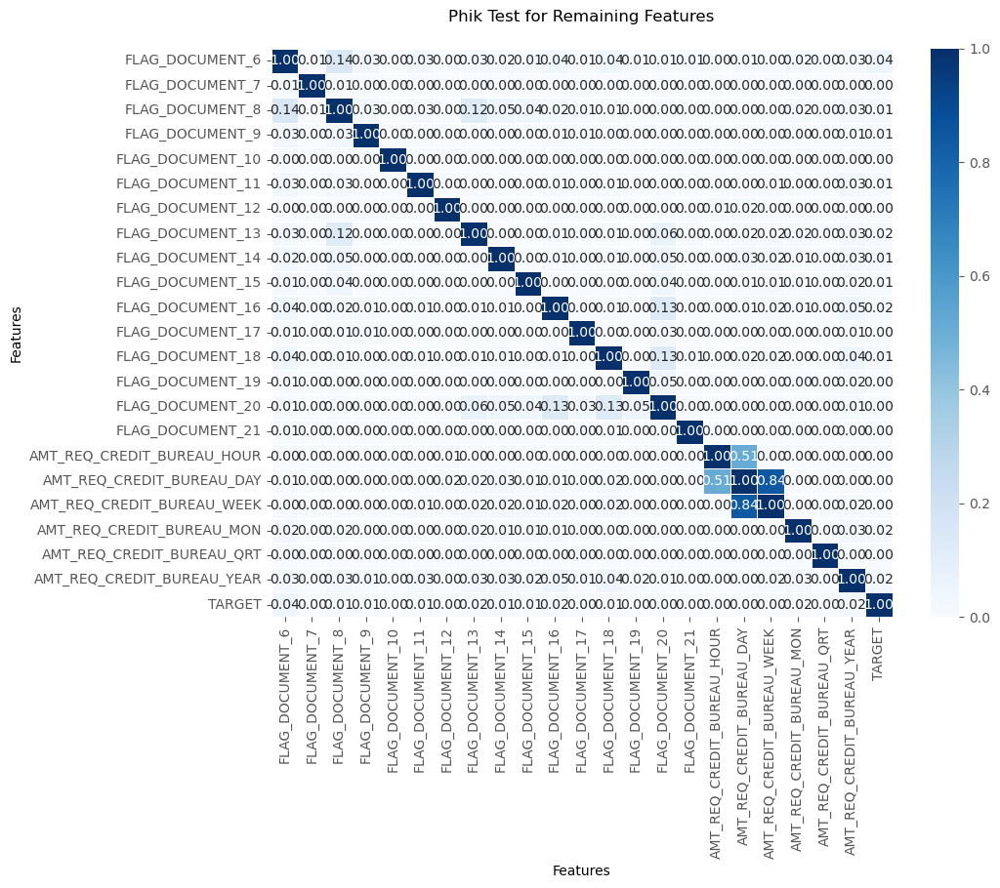

In [143]:
import phik
import matplotlib.pyplot as plt
import seaborn as sns

# Select the remaining features from the DataFrame
selected_features = df.columns[100:].tolist()
selected_features.append('TARGET')
selected_data = df[selected_features]

# Compute the Phik correlation matrix without parallelization
result = selected_data.phik_matrix(njobs=1)

# Set the figure size based on the number of features
num_features = len(result.columns)
fig_width = min(12, max(6, num_features * 0.5))
fig_height = min(10, max(6, num_features * 0.4))
fig, ax = plt.subplots(figsize=(fig_width, fig_height))

# Generate the heatmap
sns.heatmap(result, annot=True, cmap='Blues', fmt='.2f', ax=ax, linewidths=0.5)

# Set the x-axis and y-axis labels
ax.set_xlabel('Features', fontsize=10)
ax.set_ylabel('Features', fontsize=10)

# Set the title and adjust the position
ax.set_title('Phik Test for Remaining Features', fontsize=12, pad=20)

# Rotate the x-axis tick labels for better readability
plt.xticks(rotation=90)

# Adjust the position of the colorbar to prevent overlap with the heatmap
plt.tight_layout(rect=[0, 0, 0.95, 1])

# Save the heatmap to a file
plt.savefig('heatmap.png')

# Display the heatmap
plt.show()


In [ ]:
#Get the features whose correlation with "TARGET" is equal or greater than 0.05 for all features.

In [151]:
# Compute the Phik correlation matrix without parallelization
result = df.phik_matrix(njobs=1)

# Set the threshold for correlation
threshold = 0.05

# Get the features whose correlation with TARGET is >= 0.05
relevant_features = result.loc['TARGET', result.columns[:-1]] >= threshold

# Print the relevant features
print("Features with correlation >= 0.05:")
for feature in result.columns[:-1][relevant_features]:
    print(feature)

interval columns not set, guessing: ['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE', '

categorical features:
FLOORSMAX_MODE
FLOORSMAX_AVG
DAYS_ID_PUBLISH
REGION_POPULATION_RELATIVE
FLOORSMAX_MEDI
FLAG_EMP_PHONE
NAME_INCOME_TYPE
AMT_GOODS_PRICE
EXT_SOURCE_2
OCCUPATION_TYPE
NAME_FAMILY_STATUS
OWN_CAR_AGE
REG_CITY_NOT_LIVE_CITY
EXT_SOURCE_3
NAME_HOUSING_TYPE
FLAG_DOCUMENT_3



Here are the non-categorical important features:

TARGET
AMT_CREDIT
DAYS_BIRTH
DAYS_EMPLOYED
DAYS_REGISTRATION
ORGANIZATION_TYPE
EXT_SOURCE_1
FLOORSMAX_MEDI
DAYS_LAST_PHONE_CHANGE
REG_CITY_NOT_WORK_CITY
LIVE_CITY_NOT_WORK_CITY


categorical important features:

FLOORSMAX_AVG
DAYS_ID_PUBLISH
REGION_POPULATION_RELATIVE
FLOORSMAX_MEDI
FLAG_EMP_PHONE
NAME_INCOME_TYPE
AMT_GOODS_PRICE
EXT_SOURCE_2
OCCUPATION_TYPE
NAME_FAMILY_STATUS
OWN_CAR_AGE
REG_CITY_NOT_LIVE_CITY
EXT_SOURCE_3
NAME_HOUSING_TYPE
FLAG_DOCUMENT_3

totally 25 important features

In [6]:
#create new dataframe df_new to store the 25 important features and TARGET variable.

In [4]:
# Specify the columns you want to extract from the original dataframe
columns = ['TARGET', 'AMT_CREDIT', 'AMT_GOODS_PRICE', 'NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS',
           'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
           'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_EMP_PHONE',
           'OCCUPATION_TYPE', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
           'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_1', 'EXT_SOURCE_2',
           'EXT_SOURCE_3', 'FLOORSMAX_AVG', 'FLOORSMAX_MODE', 'FLOORSMAX_MEDI',
           'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_3']

# Create a new dataframe with the specified columns from the original dataframe
df_new = df[columns].copy()




In [5]:
df_new.head()

,TARGET,AMT_CREDIT,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_EMP_PHONE,OCCUPATION_TYPE,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,FLOORSMAX_AVG,FLOORSMAX_MODE,FLOORSMAX_MEDI,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3
0,1,406597.5,351000.0,Working,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,Laborers,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0833,0.0833,0.0833,-1134.0,1
1,0,1293502.5,1129500.0,State servant,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,Core staff,0,0,0,School,0.311267,0.622246,NaN,0.2917,0.2917,0.2917,-828.0,1
2,0,135000.0,135000.0,Working,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,Laborers,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,-815.0,0
3,0,312682.5,297000.0,Working,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,NaN,1,Laborers,0,0,0,Business Entity Type 3,NaN,0.650442,NaN,NaN,NaN,NaN,-617.0,1
4,0,513000.0,513000.0,Working,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,NaN,1,Core staff,0,1,1,Religion,NaN,0.322738,NaN,NaN,NaN,NaN,-1106.0,0


In [6]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 26 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   TARGET                      307511 non-null  int64  
 1   AMT_CREDIT                  307511 non-null  float64
 2   AMT_GOODS_PRICE             307233 non-null  float64
 3   NAME_INCOME_TYPE            307511 non-null  object 
 4   NAME_FAMILY_STATUS          307511 non-null  object 
 5   NAME_HOUSING_TYPE           307511 non-null  object 
 6   REGION_POPULATION_RELATIVE  307511 non-null  float64
 7   DAYS_BIRTH                  307511 non-null  int64  
 8   DAYS_EMPLOYED               307511 non-null  int64  
 9   DAYS_REGISTRATION           307511 non-null  float64
 10  DAYS_ID_PUBLISH             307511 non-null  int64  
 11  OWN_CAR_AGE                 104582 non-null  float64
 12  FLAG_EMP_PHONE              307511 non-null  int64  
 13  OCCUPATION_TYP

In [7]:
import pandas as pd

# Categorical variables
categorical_vars = ['NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
                    'FLAG_EMP_PHONE', 'OCCUPATION_TYPE', 'REG_CITY_NOT_LIVE_CITY',
                    'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE',
                    'FLAG_DOCUMENT_3']

# Numerical variables
numerical_vars = ['AMT_CREDIT', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE',
                  'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH',
                  'OWN_CAR_AGE', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
                  'FLOORSMAX_AVG', 'FLOORSMAX_MODE', 'FLOORSMAX_MEDI',
                  'DAYS_LAST_PHONE_CHANGE']

# Extract categorical variables
df_categorical = df_new[categorical_vars].copy()

# Extract numerical variables
df_numerical = df_new[numerical_vars].copy()

# Count the number of categorical and numerical variables
num_categorical_vars = len(categorical_vars)
num_numerical_vars = len(numerical_vars)

# Display the categorical variables dataframe
print("Categorical Variables ({} variables):".format(num_categorical_vars))
print(df_categorical.count())

# Display the numerical variables dataframe
print("\nNumerical Variables ({} variables):".format(num_numerical_vars))
print(df_numerical.count())


Categorical Variables (10 variables):
NAME_INCOME_TYPE           307511
NAME_FAMILY_STATUS         307511
NAME_HOUSING_TYPE          307511
FLAG_EMP_PHONE             307511
OCCUPATION_TYPE            211120
REG_CITY_NOT_LIVE_CITY     307511
REG_CITY_NOT_WORK_CITY     307511
LIVE_CITY_NOT_WORK_CITY    307511
ORGANIZATION_TYPE          307511
FLAG_DOCUMENT_3            307511
dtype: int64

Numerical Variables (15 variables):
AMT_CREDIT                    307511
AMT_GOODS_PRICE               307233
REGION_POPULATION_RELATIVE    307511
DAYS_BIRTH                    307511
DAYS_EMPLOYED                 307511
DAYS_REGISTRATION             307511
DAYS_ID_PUBLISH               307511
OWN_CAR_AGE                   104582
EXT_SOURCE_1                  134133
EXT_SOURCE_2                  306851
EXT_SOURCE_3                  246546
FLOORSMAX_AVG                 154491
FLOORSMAX_MODE                154491
FLOORSMAX_MEDI                154491
DAYS_LAST_PHONE_CHANGE        307510
dtype: int64


In [8]:
df_categorical.head(30)

,NAME_INCOME_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,FLAG_EMP_PHONE,OCCUPATION_TYPE,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,FLAG_DOCUMENT_3
0,Working,Single / not married,House / apartment,1,Laborers,0,0,0,Business Entity Type 3,1
1,State servant,Married,House / apartment,1,Core staff,0,0,0,School,1
2,Working,Single / not married,House / apartment,1,Laborers,0,0,0,Government,0
3,Working,Civil marriage,House / apartment,1,Laborers,0,0,0,Business Entity Type 3,1
4,Working,Single / not married,House / apartment,1,Core staff,0,1,1,Religion,0
5,State servant,Married,House / apartment,1,Laborers,0,0,0,Other,1
6,Commercial associate,Married,House / apartment,1,Accountants,0,0,0,Business Entity Type 3,0
7,State servant,Married,House / apartment,1,Managers,0,1,1,Other,1
8,Pensioner,Married,House / apartment,0,NaN,0,0,0,XNA,1
9,Working,Single / not married,House / apartment,1,Laborers,0,0,0,Electricity,0


In [24]:
df_numerical.head(30)

,AMT_CREDIT,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,FLOORSMAX_AVG,FLOORSMAX_MODE,FLOORSMAX_MEDI,DAYS_LAST_PHONE_CHANGE
0,406597.5,351000.0,0.018801,-9461,-637,-3648.0,-2120,NaN,0.083037,0.262949,0.139376,0.0833,0.0833,0.0833,-1134.0
1,1293502.5,1129500.0,0.003541,-16765,-1188,-1186.0,-291,NaN,0.311267,0.622246,NaN,0.2917,0.2917,0.2917,-828.0
2,135000.0,135000.0,0.010032,-19046,-225,-4260.0,-2531,26.0,NaN,0.555912,0.729567,NaN,NaN,NaN,-815.0
3,312682.5,297000.0,0.008019,-19005,-3039,-9833.0,-2437,NaN,NaN,0.650442,NaN,NaN,NaN,NaN,-617.0
4,513000.0,513000.0,0.028663,-19932,-3038,-4311.0,-3458,NaN,NaN,0.322738,NaN,NaN,NaN,NaN,-1106.0
5,490495.5,454500.0,0.035792,-16941,-1588,-4970.0,-477,NaN,NaN,0.354225,0.621226,NaN,NaN,NaN,-2536.0
6,1560726.0,1395000.0,0.035792,-13778,-3130,-1213.0,-619,17.0,0.774761,0.724000,0.492060,NaN,NaN,NaN,-1562.0
7,1530000.0,1530000.0,0.003122,-18850,-449,-4597.0,-2379,8.0,NaN,0.714279,0.540654,NaN,NaN,NaN,-1070.0
8,1019610.0,913500.0,0.018634,-20099,365243,-7427.0,-3514,NaN,0.587334,0.205747,0.751724,NaN,NaN,NaN,0.0
9,405000.0,405000.0,0.019689,-14469,-2019,-14437.0,-3992,NaN,NaN,0.746644,NaN,NaN,NaN,NaN,-1673.0


In [25]:
#CHECK MISSING VALUE

In [26]:

missing_percentage = (df_numerical.isnull().sum() / len(df_numerical)) * 100

print("Missing Percentage:")
print(missing_percentage)



Missing Percentage:
AMT_CREDIT                     0.000000
AMT_GOODS_PRICE                0.090403
REGION_POPULATION_RELATIVE     0.000000
DAYS_BIRTH                     0.000000
DAYS_EMPLOYED                  0.000000
DAYS_REGISTRATION              0.000000
DAYS_ID_PUBLISH                0.000000
OWN_CAR_AGE                   65.990810
EXT_SOURCE_1                  56.381073
EXT_SOURCE_2                   0.214626
EXT_SOURCE_3                  19.825307
FLOORSMAX_AVG                 49.760822
FLOORSMAX_MODE                49.760822
FLOORSMAX_MEDI                49.760822
DAYS_LAST_PHONE_CHANGE         0.000325
dtype: float64


In [27]:
#CHECK SKEWNESS FOR NUMERICAL FEATURES

In [23]:


# Calculate skewness of df_numerical
skewness = df_numerical.skew()

# Filter variables with skewness > 1 or skewness < -1
skewed_variables = skewness[(skewness > 1) | (skewness < -1)]

# Print the skewed variables
print("Skewed Variables:")
print(skewed_variables)


Skewed Variables:
AMT_CREDIT                    1.234778
AMT_GOODS_PRICE               1.349000
REGION_POPULATION_RELATIVE    1.488009
DAYS_EMPLOYED                 1.664346
OWN_CAR_AGE                   2.745422
FLOORSMAX_AVG                 1.226454
FLOORSMAX_MODE                1.244343
FLOORSMAX_MEDI                1.240185
dtype: float64


In [28]:
#fill skewness data with median, and unskewness data with mean

In [29]:


# Calculate skewness of df_numerical
skewness = df_numerical.skew()

# Identify variables with skewness
skewed_variables = skewness[(skewness > 1) | (skewness < -1)]

# Fill missing values with median for skewed variables, and mean for others
for column in df_numerical.columns:
    if column in skewed_variables:
        df_numerical[column].fillna(df_numerical[column].median(), inplace=True)
    else:
        df_numerical[column].fillna(df_numerical[column].mean(), inplace=True)


In [30]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Calculate VIF for each numerical variable
vif = pd.DataFrame()
vif["Variable"] = df_numerical.columns
vif["VIF"] = [variance_inflation_factor(df_numerical.values, i) for i in range(df_numerical.shape[1])]

# Display the VIF results
print("Variance Inflation Factor (VIF):")
print(vif)


Variance Inflation Factor (VIF):
                      Variable         VIF
0                   AMT_CREDIT  122.354985
1              AMT_GOODS_PRICE  119.453510
2   REGION_POPULATION_RELATIVE    3.670592
3                   DAYS_BIRTH   24.640666
4                DAYS_EMPLOYED    1.861690
5            DAYS_REGISTRATION    3.400568
6              DAYS_ID_PUBLISH    5.331198
7                  OWN_CAR_AGE    2.787728
8                 EXT_SOURCE_1   15.145678
9                 EXT_SOURCE_2    8.817655
10                EXT_SOURCE_3    9.093955
11               FLOORSMAX_AVG  806.276333
12              FLOORSMAX_MODE  201.638862
13              FLOORSMAX_MEDI  971.770686
14      DAYS_LAST_PHONE_CHANGE    2.502631


1.VIF starts at 1 and has no upper limit

2.VIF = 1, no correlation between the independent variable and the other variables

3.VIF exceeding 5 or 10 indicates high multicollinearity between this independent variable and the others

1.drop "EXT_SOURCE_1" (56% missing value and high VIF)
2.drop "FLOORSMAX_AVG" and "FLOORSMAX_MEDI" (high VIF)




In [31]:
#RUN VIF AGAIN AFTER DROPPING SEVERAL FEATURES

In [32]:


# Create a new DataFrame without the specified features
df_numerical_dropped = df_numerical.drop(["EXT_SOURCE_1", "FLOORSMAX_AVG", "FLOORSMAX_MEDI"], axis=1)

# Calculate the VIF
vif = pd.DataFrame()
vif["Variable"] = df_numerical_dropped.columns
vif["VIF"] = [variance_inflation_factor(df_numerical_dropped.values, i) for i in range(df_numerical_dropped.shape[1])]

# Display the VIF results
print("Variance Inflation Factor (VIF):")
print(vif)


Variance Inflation Factor (VIF):
                      Variable         VIF
0                   AMT_CREDIT  122.339195
1              AMT_GOODS_PRICE  119.361065
2   REGION_POPULATION_RELATIVE    3.615473
3                   DAYS_BIRTH   18.742208
4                DAYS_EMPLOYED    1.797583
5            DAYS_REGISTRATION    3.400311
6              DAYS_ID_PUBLISH    5.318714
7                  OWN_CAR_AGE    2.777031
8                 EXT_SOURCE_2    8.624765
9                 EXT_SOURCE_3    8.903134
10              FLOORSMAX_MODE    4.531340
11      DAYS_LAST_PHONE_CHANGE    2.499610


1. DROP AMT_CREDIT, DAYS_BIRTH AND EXT_SOURCE_3, AND RUN VIF AGAIN

In [33]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Create a new DataFrame without the specified features
df_numerical_dropped = df_numerical_dropped.drop(["AMT_CREDIT", "DAYS_BIRTH", "EXT_SOURCE_3"], axis=1)

# Calculate the VIF
vif = pd.DataFrame()
vif["Variable"] = df_numerical_dropped.columns
vif["VIF"] = [variance_inflation_factor(df_numerical_dropped.values, i) for i in range(df_numerical_dropped.shape[1])]

# Display the VIF results
print("Variance Inflation Factor (VIF):")
print(vif)


Variance Inflation Factor (VIF):
                     Variable       VIF
0             AMT_GOODS_PRICE  3.081073
1  REGION_POPULATION_RELATIVE  3.592761
2               DAYS_EMPLOYED  1.361292
3           DAYS_REGISTRATION  2.984823
4             DAYS_ID_PUBLISH  4.631583
5                 OWN_CAR_AGE  2.602749
6                EXT_SOURCE_2  7.251802
7              FLOORSMAX_MODE  4.325729
8      DAYS_LAST_PHONE_CHANGE  2.462823


### Feature selection using Recursive Feature Elimination with cross validation (RFECV)

In [34]:
import pandas as pd
from sklearn.feature_selection import RFECV
from sklearn.linear_model import LogisticRegression

# Separate the target variable from the features
X = df_numerical_dropped
y = df["TARGET"]

# Create a logistic regression model
model = LogisticRegression()

# Create an RFECV object
rfecv = RFECV(estimator=model)

# Fit the RFECV object to the data
rfecv.fit(X, y)

# Get the ranked feature names and their corresponding ranks
feature_ranks = pd.DataFrame({
    "Feature": X.columns,
    "Rank": rfecv.ranking_
})

# Sort the features by rank
feature_ranks = feature_ranks.sort_values("Rank")

# Display the ranked features
print("Ranked Features:")
print(feature_ranks)


Ranked Features:
                      Feature  Rank
5                 OWN_CAR_AGE     1
8      DAYS_LAST_PHONE_CHANGE     2
4             DAYS_ID_PUBLISH     3
3           DAYS_REGISTRATION     4
0             AMT_GOODS_PRICE     5
2               DAYS_EMPLOYED     6
6                EXT_SOURCE_2     7
7              FLOORSMAX_MODE     8
1  REGION_POPULATION_RELATIVE     9


The output "Ranked Features" shows the ranking of selected features based on the Recursive Feature Elimination with Cross Validation (RFECV) process. Each feature is assigned a rank, where a lower rank indicates higher importance or relevance according to the RFECV algorithm.

In the example output you provided:

The feature "OWN_CAR_AGE" has the lowest rank of 1, indicating it is considered the most important feature by the RFECV algorithm.
The feature "DAYS_LAST_PHONE_CHANGE" has a rank of 2, indicating it is the second most important feature.
The feature "DAYS_ID_PUBLISH" has a rank of 3, indicating it is the third most important feature.
The remaining features are ranked in descending order, with "REGION_POPULATION_RELATIVE" having the highest rank of 9.
Based on this ranking, you can consider the top-ranked features as the most influential for predicting the target variable.

In [30]:
#check categorical features

In [31]:
df_categorical.head(30)

,NAME_INCOME_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,FLAG_EMP_PHONE,OCCUPATION_TYPE,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,FLAG_DOCUMENT_3
0,Working,Single / not married,House / apartment,1,Laborers,0,0,0,Business Entity Type 3,1
1,State servant,Married,House / apartment,1,Core staff,0,0,0,School,1
2,Working,Single / not married,House / apartment,1,Laborers,0,0,0,Government,0
3,Working,Civil marriage,House / apartment,1,Laborers,0,0,0,Business Entity Type 3,1
4,Working,Single / not married,House / apartment,1,Core staff,0,1,1,Religion,0
5,State servant,Married,House / apartment,1,Laborers,0,0,0,Other,1
6,Commercial associate,Married,House / apartment,1,Accountants,0,0,0,Business Entity Type 3,0
7,State servant,Married,House / apartment,1,Managers,0,1,1,Other,1
8,Pensioner,Married,House / apartment,0,NaN,0,0,0,XNA,1
9,Working,Single / not married,House / apartment,1,Laborers,0,0,0,Electricity,0


In [32]:
#check uniqueness of each categorical feature

In [10]:
uniqueness = df_categorical.nunique()
print(uniqueness)

NAME_INCOME_TYPE            8
NAME_FAMILY_STATUS          6
NAME_HOUSING_TYPE           6
FLAG_EMP_PHONE              2
OCCUPATION_TYPE            18
REG_CITY_NOT_LIVE_CITY      2
REG_CITY_NOT_WORK_CITY      2
LIVE_CITY_NOT_WORK_CITY     2
ORGANIZATION_TYPE          58
FLAG_DOCUMENT_3             2
dtype: int64


In [11]:
#extract all the unique value for each categorical feature

In [12]:
# Calculate the number of unique values for each feature
num_unique_values = df_categorical.nunique()

# Sort the features based on the number of unique values in ascending order
sorted_features = num_unique_values.sort_values()

# Iterate over the sorted features
for feature in sorted_features.index:
    unique_values = df_categorical[feature].unique()
    num_uniqueness = len(unique_values)
    print(f"Feature '{feature}':")
    print(f"Unique values: {unique_values}")
    print(f"Number of unique values: {num_uniqueness}")
    print()


Feature 'FLAG_EMP_PHONE':
Unique values: [1 0]
Number of unique values: 2

Feature 'REG_CITY_NOT_LIVE_CITY':
Unique values: [0 1]
Number of unique values: 2

Feature 'REG_CITY_NOT_WORK_CITY':
Unique values: [0 1]
Number of unique values: 2

Feature 'LIVE_CITY_NOT_WORK_CITY':
Unique values: [0 1]
Number of unique values: 2

Feature 'FLAG_DOCUMENT_3':
Unique values: [1 0]
Number of unique values: 2

Feature 'NAME_FAMILY_STATUS':
Unique values: ['Single / not married' 'Married' 'Civil marriage' 'Widow' 'Separated'
 'Unknown']
Number of unique values: 6

Feature 'NAME_HOUSING_TYPE':
Unique values: ['House / apartment' 'Rented apartment' 'With parents'
 'Municipal apartment' 'Office apartment' 'Co-op apartment']
Number of unique values: 6

Feature 'NAME_INCOME_TYPE':
Unique values: ['Working' 'State servant' 'Commercial associate' 'Pensioner' 'Unemployed'
 'Student' 'Businessman' 'Maternity leave']
Number of unique values: 8

Feature 'OCCUPATION_TYPE':
Unique values: ['Laborers' 'Core staff

In [13]:
#check missing values for categorical features


In [14]:


# Calculate the missing percentage for each feature
missing_percentage = (df_categorical.isnull().mean() * 100).round(2)

# Print the missing percentage for each feature
print(missing_percentage)



NAME_INCOME_TYPE            0.00
NAME_FAMILY_STATUS          0.00
NAME_HOUSING_TYPE           0.00
FLAG_EMP_PHONE              0.00
OCCUPATION_TYPE            31.35
REG_CITY_NOT_LIVE_CITY      0.00
REG_CITY_NOT_WORK_CITY      0.00
LIVE_CITY_NOT_WORK_CITY     0.00
ORGANIZATION_TYPE           0.00
FLAG_DOCUMENT_3             0.00
dtype: float64


In [15]:


# Fill missing values in OCCUPATION_TYPE with "unknown career"
df_categorical['OCCUPATION_TYPE'].fillna("unknown career", inplace=True)




In [16]:
#convert 'NAME_FAMILY_STATUS','NAME_HOUSING_TYPE','NAME_INCOME_TYPE','OCCUPATION_TYPE','ORGANIZATION_TYPE'to dummy variables

In [ ]:
#keep the binary features untouched, we get df_enoded after transforming categorical features to numerical features.

In [21]:
import pandas as pd

# Assuming df_categorical is your DataFrame containing the categorical features
# You can replace df_categorical with your actual DataFrame

# Select the categorical features to convert to dummy variables
categorical_features = ['NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'NAME_INCOME_TYPE', 'OCCUPATION_TYPE', 'ORGANIZATION_TYPE']

# Convert categorical features to dummy variables
df_encoded = pd.get_dummies(df_categorical, columns=categorical_features)




In [22]:
df_encoded.head()

,FLAG_EMP_PHONE,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,FLAG_DOCUMENT_3,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,OCCUPATION_TYPE_unknown career,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7,ORGANIZATION_TYPE_Industry: type 8,ORGANIZATION_TYPE_Industry: type 9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal Services,ORGANIZATION_TYPE_Medicine,ORGANIZATION_TYPE_Military,ORGANIZATION_TYPE_Mobile,ORGANIZATION_TYPE_Other,ORGANIZATION_TYPE_Police,ORGANIZATION_TYPE_Postal,ORGANIZATION_TYPE_Realtor,ORGANIZATION_TYPE_Religion,ORGANIZATION_TYPE_Restaurant,ORGANIZATION_TYPE_School,ORGANIZATION_TYPE_Security,ORGANIZATION_TYPE_Security Ministries,ORGANIZATION_TYPE_Self-employed,ORGANIZATION_TYPE_Services,ORGANIZATION_TYPE_Telecom,ORGANIZATION_TYPE_Trade: type 1,ORGANIZATION_TYPE_Trade: type 2,ORGANIZATION_TYPE_Trade: type 3,ORGANIZATION_TYPE_Trade: type 4,ORGANIZATION_TYPE_Trade: type 5,ORGANIZATION_TYPE_Trade: type 6,ORGANIZATION_TYPE_Trade: type 7,ORGANIZATION_TYPE_Transport: type 1,ORGANIZATION_TYPE_Transport: type 2,ORGANIZATION_TYPE_Transport: type 3,ORGANIZATION_TYPE_Transport: type 4,ORGANIZATION_TYPE_University,ORGANIZATION_TYPE_XNA
0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1,0,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0

In [23]:


# Extract the column names from df_encoded
column_names = df_encoded.columns.tolist()

# Print the column names
print(column_names)


['FLAG_EMP_PHONE', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'FLAG_DOCUMENT_3', 'NAME_FAMILY_STATUS_Civil marriage', 'NAME_FAMILY_STATUS_Married', 'NAME_FAMILY_STATUS_Separated', 'NAME_FAMILY_STATUS_Single / not married', 'NAME_FAMILY_STATUS_Unknown', 'NAME_FAMILY_STATUS_Widow', 'NAME_HOUSING_TYPE_Co-op apartment', 'NAME_HOUSING_TYPE_House / apartment', 'NAME_HOUSING_TYPE_Municipal apartment', 'NAME_HOUSING_TYPE_Office apartment', 'NAME_HOUSING_TYPE_Rented apartment', 'NAME_HOUSING_TYPE_With parents', 'NAME_INCOME_TYPE_Businessman', 'NAME_INCOME_TYPE_Commercial associate', 'NAME_INCOME_TYPE_Maternity leave', 'NAME_INCOME_TYPE_Pensioner', 'NAME_INCOME_TYPE_State servant', 'NAME_INCOME_TYPE_Student', 'NAME_INCOME_TYPE_Unemployed', 'NAME_INCOME_TYPE_Working', 'OCCUPATION_TYPE_Accountants', 'OCCUPATION_TYPE_Cleaning staff', 'OCCUPATION_TYPE_Cooking staff', 'OCCUPATION_TYPE_Core staff', 'OCCUPATION_TYPE_Drivers', 'OCCUPATION_TYPE_HR staff', 'OCCUPATION_T

In [35]:




# Concatenate the dataframes along the columns axis (axis=1)
df_newest = pd.concat([df_numerical_dropped, df_encoded], axis=1)



In [38]:
df_newest.head()


,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,EXT_SOURCE_2,FLOORSMAX_MODE,DAYS_LAST_PHONE_CHANGE,FLAG_EMP_PHONE,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,FLAG_DOCUMENT_3,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,OCCUPATION_TYPE_unknown career,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7,ORGANIZATION_TYPE_Industry: type 8,ORGANIZATION_TYPE_Industry: type 9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal Services,ORGANIZATION_TYPE_Medicine,ORGANIZATION_TYPE_Military,ORGANIZATION_TYPE_Mobile,ORGANIZATION_TYPE_Other,ORGANIZATION_TYPE_Police,ORGANIZATION_TYPE_Postal,ORGANIZATION_TYPE_Realtor,ORGANIZATION_TYPE_Religion,ORGANIZATION_TYPE_Restaurant,ORGANIZATION_TYPE_School,ORGANIZATION_TYPE_Security,ORGANIZATION_TYPE_Security Ministries,ORGANIZATION_TYPE_Self-employed,ORGANIZATION_TYPE_Services,ORGANIZATION_TYPE_Telecom,ORGANIZATION_TYPE_Trade: type 1,ORGANIZATION_TYPE_Trade: type 2,ORGANIZATION_TYPE_Trade: type 3,ORGANIZATION_TYPE_Trade: type 4,ORGANIZATION_TYPE_Trade: type 5,ORGANIZATION_TYPE_Trade: type 6,ORGANIZATION_TYPE_Trade: type 7,ORGANIZATION_TYPE_Transport: type 1,ORGANIZATION_TYPE_Transport: type 2,ORGANIZATION_TYPE_Transport: type 3,ORGANIZATION_TYPE_Transport: type 4,ORGANIZATION_TYPE_University,ORGANIZATION_TYPE_XNA
0,351000.0,0.018801,-637,-3648.0,-2120,9.0,0.262949,0.0833,-1134.0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1129500.0,0.003541,-1188,-1186.0,-291,9.0,0.622246,0.2917,-828.0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,135000.0,0.010032,-225,-4260.0,-2531,26.0,0.555912,0.1667,-815.0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,

In [43]:
df_newest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 111 entries, AMT_GOODS_PRICE to ORGANIZATION_TYPE_XNA
dtypes: float64(7), int64(7), uint8(97)
memory usage: 61.3 MB


In [39]:


# Extract all the features (column names) from df_newest
features = df_newest.columns.tolist()


In [40]:
# Print all the features
for feature in features:
    print(feature)

AMT_GOODS_PRICE
REGION_POPULATION_RELATIVE
DAYS_EMPLOYED
DAYS_REGISTRATION
DAYS_ID_PUBLISH
OWN_CAR_AGE
EXT_SOURCE_2
FLOORSMAX_MODE
DAYS_LAST_PHONE_CHANGE
FLAG_EMP_PHONE
REG_CITY_NOT_LIVE_CITY
REG_CITY_NOT_WORK_CITY
LIVE_CITY_NOT_WORK_CITY
FLAG_DOCUMENT_3
NAME_FAMILY_STATUS_Civil marriage
NAME_FAMILY_STATUS_Married
NAME_FAMILY_STATUS_Separated
NAME_FAMILY_STATUS_Single / not married
NAME_FAMILY_STATUS_Unknown
NAME_FAMILY_STATUS_Widow
NAME_HOUSING_TYPE_Co-op apartment
NAME_HOUSING_TYPE_House / apartment
NAME_HOUSING_TYPE_Municipal apartment
NAME_HOUSING_TYPE_Office apartment
NAME_HOUSING_TYPE_Rented apartment
NAME_HOUSING_TYPE_With parents
NAME_INCOME_TYPE_Businessman
NAME_INCOME_TYPE_Commercial associate
NAME_INCOME_TYPE_Maternity leave
NAME_INCOME_TYPE_Pensioner
NAME_INCOME_TYPE_State servant
NAME_INCOME_TYPE_Student
NAME_INCOME_TYPE_Unemployed
NAME_INCOME_TYPE_Working
OCCUPATION_TYPE_Accountants
OCCUPATION_TYPE_Cleaning staff
OCCUPATION_TYPE_Cooking staff
OCCUPATION_TYPE_Core staff
OC

In [41]:
import pandas as pd
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler


# Separate the features and target variable
X = df_newest
y = df['TARGET']  # Replace 'target_variable_column_name' with the actual column name of your target variable

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Define the estimator (classifier/regressor) for feature selection
estimator = LogisticRegression()  # Replace with your desired estimator

# Perform Recursive Feature Elimination with Cross-Validation (RFECV)
rfecv = RFECV(estimator=estimator, cv=StratifiedKFold(), scoring='accuracy')  # Replace 'accuracy' with the desired scoring metric
rfecv.fit(X_scaled, y)

# Obtain the ranked features
ranked_features = pd.DataFrame({'Feature': X.columns, 'Ranking': rfecv.ranking_})
ranked_features = ranked_features.sort_values('Ranking')

# Print the ranked features
print(ranked_features)


                                      Feature  Ranking
0                             AMT_GOODS_PRICE        1
80                ORGANIZATION_TYPE_Insurance        1
79         ORGANIZATION_TYPE_Industry: type 9        1
78         ORGANIZATION_TYPE_Industry: type 8        1
77         ORGANIZATION_TYPE_Industry: type 7        1
76         ORGANIZATION_TYPE_Industry: type 6        1
75         ORGANIZATION_TYPE_Industry: type 5        1
74         ORGANIZATION_TYPE_Industry: type 4        1
73         ORGANIZATION_TYPE_Industry: type 3        1
72         ORGANIZATION_TYPE_Industry: type 2        1
71        ORGANIZATION_TYPE_Industry: type 13        1
70        ORGANIZATION_TYPE_Industry: type 12        1
81             ORGANIZATION_TYPE_Kindergarten        1
69        ORGANIZATION_TYPE_Industry: type 11        1
67         ORGANIZATION_TYPE_Industry: type 1        1
66                  ORGANIZATION_TYPE_Housing        1
65                    ORGANIZATION_TYPE_Hotel        1
64        

In [42]:


# Count the number of ranked features
num_ranked_features = ranked_features.shape[0]

# Print the count
print("Number of ranked features:", num_ranked_features)


Number of ranked features: 111


<a id="4"></a>
<h1 style="background-color:#16DCC9;font-family:monospace;font-size:250%;text-align:center">Modelling</h1>

In [3]:
# Models
from sklearn.model_selection import KFold,RandomizedSearchCV, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier,RandomForestClassifier
import xgboost as xgb
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
import warnings

OSError: dlopen(/Users/lilichen/anaconda3/lib/python3.10/site-packages/lightgbm/lib_lightgbm.so, 0x0006): Library not loaded: /usr/local/opt/libomp/lib/libomp.dylib
  Referenced from: <D21A7969-4567-3BC7-94ED-6A9E83AE9D78> /Users/lilichen/anaconda3/lib/python3.10/site-packages/lightgbm/lib_lightgbm.so
  Reason: tried: '/usr/local/opt/libomp/lib/libomp.dylib' (no such file), '/System/Volumes/Preboot/Cryptexes/OS/usr/local/opt/libomp/lib/libomp.dylib' (no such file), '/usr/local/opt/libomp/lib/libomp.dylib' (no such file), '/usr/local/lib/libomp.dylib' (no such file), '/usr/lib/libomp.dylib' (no such file, not in dyld cache)

In [ ]:
# Metrics
from sklearn import metrics
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, roc_curve, roc_auc_score
from sklearn.metrics import auc, roc_curve, f1_score, accuracy_score, recall_score, precision_score

In [4]:
## A function for model evaluation
# A function for model evaluation
def report_loss_cf(name, model, X_train, y_train, X_test, y_test, graph = 0):
    
    print('Model performance for: ', name)
    
    def calculate_loss(model, X, y):
        pred = model.predict(X)
        pred_proba = model.predict_proba(X)

        accuracy = accuracy_score(y, pred)
        precision = precision_score(y, pred)
        recall = recall_score(y, pred)
        f1 = f1_score(y, pred)
        auc = roc_auc_score(y, pred_proba[:,1])
        fpr, tpr, _ = roc_curve(y, pred_proba[:,1])
        return pred, accuracy, precision, recall, f1, auc, fpr, tpr
    
    y_train_pred, accuracy_train, precision_train, recall_train, f1_train, auc_train, fpr_train, tpr_train = calculate_loss(
        model, X_train, y_train)
    print(f'train set accuracy: {accuracy_train:.3f}')
    print(f'train set precision: {precision_train:.3f}')
    print(f'train set recall: {recall_train:.3f}')
    print(f'train set f1 score: {f1_train:.3f}')
    print(f'training set AUC score: {auc_train:.3f}')
    print()
    
    y_test_pred, accuracy_test, precision_test, recall_test, f1_test, auc_test, fpr_test, tpr_test = calculate_loss(
        model, X_test, y_test)
    print(f'test set accuracy: {accuracy_test:.3f}')
    print(f'test set precision: {precision_test:.3f}')
    print(f'test set recall: {recall_test:.3f}')
    print(f'test set f1 score: {f1_test:.3f}')
    print(f'test set AUC score: {auc_test:.3f}')

    if graph == 0:
        return 

    elif graph == 1:
        
        fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize = (7, 3))
        cm_train = confusion_matrix(y_train, y_train_pred)
        cm_test = confusion_matrix(y_test, y_test_pred)
        
        sns.heatmap(cm_train, annot = True, cmap = "Blues", fmt = 'g', ax = ax1)
        ax1.set_title('train set')
        ax1.set_xlabel('Predicted labl')
        ax1.set_ylabel('True label')
        ax1.xaxis.set_ticklabels(['0', '1'])
        ax1.yaxis.set_ticklabels(['0', '1'])
        
        sns.heatmap(cm_test, annot = True, cmap = "Blues", fmt = 'g', ax = ax2)
        ax2.set_title('test set')
        ax2.set_xlabel('Predicted labl')
        ax2.set_ylabel('True label')
        ax2.xaxis.set_ticklabels(['0', '1'])
        ax2.yaxis.set_ticklabels(['0', '1'])
        plt.tight_layout()
        plt.show()
        
    #elif graph == 2:   
        
        plt.figure(figsize = (5,4))
        plt.plot([0,1], [0,1], linestyle = '--', label = 'random')
        plt.plot(fpr_train, tpr_train,label = "Train_AUC=" + str(auc_train.round(3)))
        plt.plot(fpr_test,tpr_test,label = "Test_AUC=" + str(auc_test.round(3)))
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.legend(loc = 4)
        plt.tight_layout()
        plt.show()

## Pipeline for Data Processing

In [5]:
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OrdinalEncoder

In [6]:
# built up the prprocess pipeline to avoid data leakage

num_feat = ['REGION_POPULATION_RELATIVE', 'DAYS_REGISTRATION', 'TOTALAREA_MODE']
num_feat_median = ['DAYS_LAST_PHONE_CHANGE','AMT_REQ_CREDIT_BUREAU_YEAR','EXT_SOURCE_3']
num_feat_mode = ['DAYS_LAST_PHONE_CHANGE']

cat_feat_onehot = ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'ORGANIZATION_TYPE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE']
cat_feat_ordinal = ['NAME_EDUCATION_TYPE']

num_transformer = Pipeline(steps=[("scaler", StandardScaler())])


num_transformer_median = Pipeline(
    steps=[
        ("imputer_num", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler())
    ]
)

num_transformer_mode = Pipeline(
    steps=[("imputer_num", SimpleImputer(strategy="most_frequent")), 
           ("scaler", StandardScaler())]
)

cat_transformer_onehot = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="constant", fill_value="unknown")),
        ("onehot", OneHotEncoder(handle_unknown="ignore")),
        ("scaler", StandardScaler(with_mean=False))
    ]
)

cat_transformer_ordinal = Pipeline(
    steps=[
        ("ordinal", OrdinalEncoder(categories=[['Higher education', 'Secondary / secondary special', 'Incomplete higher',
 'Lower secondary', 'Academic degree']])),
        ("scaler", StandardScaler())
    ]
)

In [7]:
# construct the transformer objects above into a preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ("num", num_transformer, num_feat),
        ("num_median", num_transformer_median, num_feat_median),
        ("num_mode", num_transformer_mode, num_feat_mode),
        ("cat_onehot", cat_transformer_onehot, cat_feat_onehot),
        ("cat_ordinal", cat_transformer_ordinal, cat_feat_ordinal)
    ]
)

## Logistic Regression

In [8]:
#. load the training data ## Pipeline for Data Processing
import pandas as pd
# load the training dataset
df = pd.read_csv('application_train.csv')
corr_columns = ['FLOORSMAX_AVG', 'FLOORSMAX_MODE', 'FLOORSMAX_MEDI', 'TOTALAREA_MODE']

for col in corr_columns:
     df[col] = df[col].interpolate(method='linear')
df.head()




,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [9]:
cat_col_final = ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'ORGANIZATION_TYPE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE']
num_col_final = ['TARGET', 'REGION_POPULATION_RELATIVE','EXT_SOURCE_3', 'DAYS_REGISTRATION', 'TOTALAREA_MODE', 'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_YEAR']

In [10]:
y = df['TARGET']
X = df[cat_col_final + num_col_final].drop('TARGET', axis = 1)

In [11]:
df['TOTALAREA_MODE'].isnull().sum()


0

In [12]:
from sklearn.model_selection import train_test_split

# Your code using train_test_split goes here

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size = 0.2, 
                                                    stratify = y, 
                                                    random_state = 42
                                                   )


In [13]:
from sklearn.linear_model import LogisticRegression
import time

start = time.time()

steps=[("pre",preprocessor),        
       ("lr", LogisticRegression(class_weight = 'balanced'))]

lg = Pipeline(steps)
model_lg = lg.fit(X_train, y_train)


Model performance for:  Logistic Regression
train set accuracy: 0.656
train set precision: 0.141
train set recall: 0.642
train set f1 score: 0.232
training set AUC score: 0.704

test set accuracy: 0.653
test set precision: 0.139
test set recall: 0.637
test set f1 score: 0.229
test set AUC score: 0.704


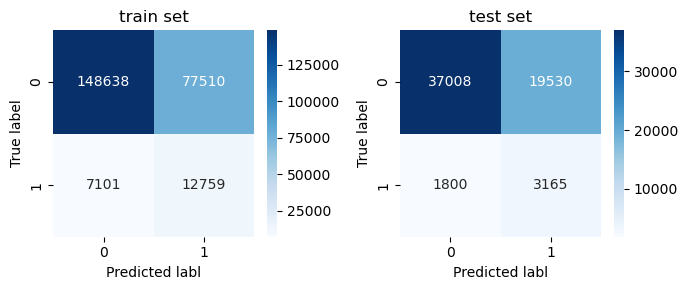

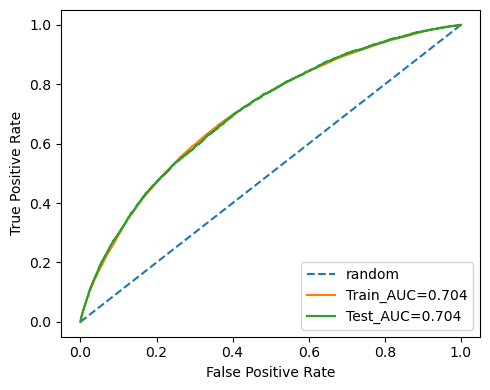

This model train session took 0.15643879572550456minutes.


In [14]:
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score,roc_auc_score,roc_curve,confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns


# Your code using plt goes here



report_loss_cf('Logistic Regression', model_lg, X_train, y_train, X_test, y_test, graph = 1)

end = time.time()
print(f'This model train session took {(end-start)/60}minutes.')

**Perform random search cross-validation**

In [97]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from scipy.stats import uniform

In [ ]:


param_grid = {
    'lr__penalty': ['l1', 'l2'],
    'lr__C': [0.1, 1.0, 10],
    'lr__solver': ['liblinear', 'saga']
}

steps=[("pre",preprocessor),        
       ("lr", LogisticRegression(class_weight = 'balanced', max_iter=100000))]

random_search = RandomizedSearchCV(lg, param_distributions=param_grid, n_iter=10, cv=5, random_state=42)
random_search.fit(X_train, y_train)

# Retrieve the best hyperparameters and model
best_params = random_search.best_params_
best_model = random_search.best_estimator_

# Evaluate the model
train_score = best_model.score(X_train, y_train)
test_score = best_model.score(X_test, y_test)

print("Best Hyperparameters:", best_params)
print("Training Score:", train_score)
print("Testing Score:", test_score)

/Users/lilichen/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/lilichen/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/lilichen/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/lilichen/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/lilichen/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/lilichen/anaconda3/lib/python3.10/site-pack

**Perform BayesSearchCV to see if we can improve the performance**

In [37]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from skopt import BayesSearchCV

In [38]:
param_grid = {
    'lr__penalty': ['l1', 'l2'],
    'lr__C': [0.1, 1.0, 10],
    'lr__solver': ['liblinear', 'saga']
}


# using BayesSearchCV to tune the parameters

steps=[("pre",preprocessor),        
       ("lr", LogisticRegression(class_weight = 'balanced', max_iter=10000))]

lg = Pipeline(steps)
bayes_cv = BayesSearchCV(lg, param_grid, cv=5, n_jobs=-1, random_state=42)

bayes_cv.fit(X_train, y_train)


/Users/lilichen/anaconda3/lib/python3.10/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/Users/lilichen/anaconda3/lib/python3.10/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/Users/lilichen/anaconda3/lib/python3.10/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/Users/lilichen/anaconda3/lib/python3.10/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/Users/lilichen/anaconda3/lib/python3.10/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warni

BayesSearchCV(cv=5,
              estimator=Pipeline(steps=[('pre',
                                         ColumnTransformer(transformers=[('num',
                                                                          Pipeline(steps=[('scaler',
                                                                                           StandardScaler())]),
                                                                          ['REGION_POPULATION_RELATIVE',
                                                                           'DAYS_REGISTRATION',
                                                                           'TOTALAREA_MODE']),
                                                                         ('num_median',
                                                                          Pipeline(steps=[('imputer_num',
                                                                                           SimpleImputer(strategy='median')),
                                                                                          ('scaler',
                                                                                           StandardScaler())]),
                                                                          ['DAYS_LAST_PHONE_CHANGE',
                                                                           'AMT_REQ_...
                                                                                                                       'education',
                                                                                                                       'Secondary '
                                                                                                                       '/ '
                                                                                                                       'secondary '
                                                                                                                       'special',
                                                                                                                       'Incomplete '
                                                                                                                       'higher',
                                                                                                                       'Lower '
                                                                                                                       'secondary',
                                                                                                                       'Academic '
                                                                                                                       'degree']])),
                                                                                          ('scaler',
                                                                                           StandardScaler())]),
                                                                          ['NAME_EDUCATION_TYPE'])])),
                                        ('lr',
                                         LogisticRegression(class_weight='balanced',
                                                            max_iter=10000))]),
              n_jobs=-1, random_state=42,
              search_spaces={'lr__C': [0.1, 1.0, 10],
                             'lr__penalty': ['l1', 'l2'],
                             'lr__solver': ['liblinear', 'saga']})

In [39]:
# Get the best hyperparameters
best_params = bayes_cv.best_params_
best_score = bayes_cv.best_score_
print(best_params)
print(best_score)


OrderedDict([('lr__C', 0.1), ('lr__penalty', 'l1'), ('lr__solver', 'liblinear')])
0.6559624153263488


/Users/lilichen/anaconda3/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model performance for:  Logistic Regression
train set accuracy: 0.656
train set precision: 0.141
train set recall: 0.642
train set f1 score: 0.232
training set AUC score: 0.704

test set accuracy: 0.653
test set precision: 0.139
test set recall: 0.637
test set f1 score: 0.229
test set AUC score: 0.704


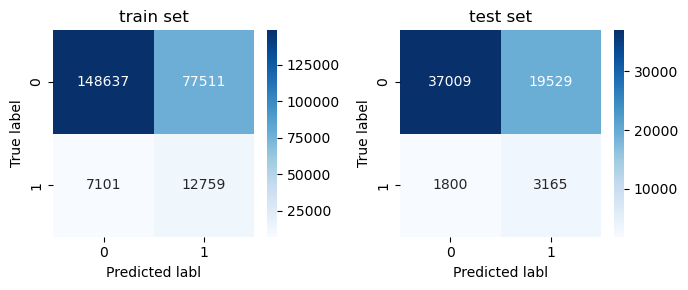

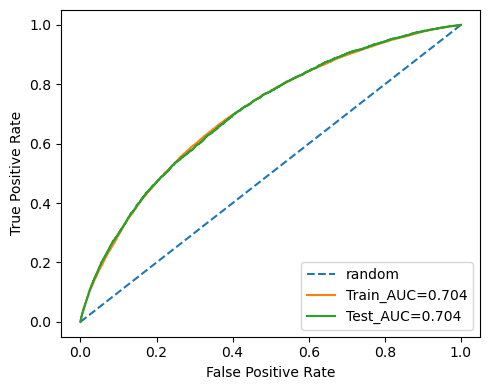

In [40]:
# Get the best model
steps=[("pre",preprocessor),        
       ("lr", LogisticRegression(class_weight = 'balanced', penalty='l1', solver='liblinear', C=10))]

lg_opt = Pipeline(steps)
model_lgopt = lg_opt.fit(X_train, y_train)

report_loss_cf('Logistic Regression', model_lgopt, X_train, y_train, X_test, y_test, graph = 1)


**plot the feature importance from this logistic regression model**

In [15]:
 import numpy as np

# Your code using NumPy goes here

# Get the feature importances
importance = model_lgopt.named_steps['lr'].coef_[0]
indices = np.argsort(np.abs(importance))[::-1][:20] # <-- slice the indices array to show the first 20
feature_names = model_lgopt.named_steps['pre'].get_feature_names_out()[indices]
feature_names = [name[5:] for name in feature_names]  # Remove first 5 characters from each feature name
feature_names = [name[1:] if name.startswith('_') else name for name in feature_names]
importance = importance[indices]

# Set up the color map
cmap = plt.cm.get_cmap('coolwarm')

NameError: name 'model_lgopt' is not defined

In [16]:
#create a dataframe to store the feature names and their importance
feature_importance = pd.DataFrame({'feature': feature_names, 'importance': importance})

#sort the dataframe based on importance
feature_importance.sort_values(by = 'importance', ascending = False, inplace = True)

#plot the dataframe
plt.figure(figsize = (10, 6))
sns.barplot(x = 'importance', y = 'feature', data = feature_importance)
plt.title('Top 20 Feature Importances')
plt.show()

NameError: name 'feature_names' is not defined

In [48]:
feature_importance

,feature,importance
1,nehot__ORGANIZATION_TYPE_XNA,0.545191
3,edian__DAYS_LAST_PHONE_CHANGE,0.232327
4,rdinal__NAME_EDUCATION_TYPE,0.151423
7,nehot__CODE_GENDER_M,0.129643
8,nehot__NAME_INCOME_TYPE_Working,0.113654
11,DAYS_REGISTRATION,0.082720
19,nehot__NAME_INCOME_TYPE_Student,-0.059835
18,nehot__ORGANIZATION_TYPE_Government,-0.061360
17,nehot__ORGANIZATION_TYPE_Police,-0.062802
16,nehot__ORGANIZATION_TYPE_Medicine,-0.063751


In [49]:
# generate pridiction from model 1 (logistic regression) and output the results to LG_results.csv
pred_y = pd.DataFrame(model_lgopt.predict_proba(X)[:,1])
pred_y.columns = ['Predicted Probability']
pred_y.to_csv('LG_results.csv',index=False, header =False)

df_new=df.copy()
df_new['Predicted Probability'] = pred_y*100
df_new.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,Predicted Probability
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,84.489608
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,31.913291
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,30.170555
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,58.007731
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,50.828997


In [50]:
# use numpy to categorize the values into three tiers
df_new['Tier'] = np.where(df_new['Predicted Probability'] < 30, 'D',
                 np.where(df_new['Predicted Probability'] < 50, 'C', 
                 np.where(df_new['Predicted Probability'] < 80, 'B','A')))

# print the results
df_new.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,Predicted Probability,Tier
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0.0,0.0,0.0,0.0,0.0,1.0,84.489608,A
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0.0,0.0,0.0,0.0,0.0,0.0,31.913291,C
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0.0,0.0,0.0,0.0,0.0,0.0,30.170555,C
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,58.007731,B
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0.0,0.0,0.0,0.0,0.0,0.0,50.828997,B


In [51]:
df_new[['TARGET','Tier']].head()

,TARGET,Tier
0,1,A
1,0,C
2,0,C
3,0,B
4,0,B


In [52]:
print(lg.named_steps.keys())

dict_keys(['pre', 'lr'])


**Plot precision_recall_curve and threshold curve of X-test**

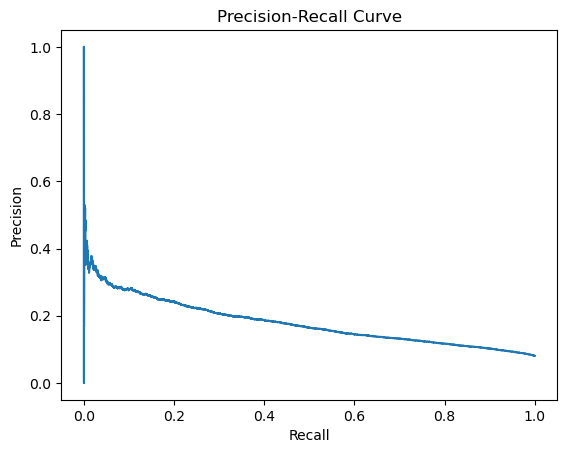

/var/folders/wh/vlvxydp55gz490wlfq6dfkvm0000gr/T/ipykernel_1643/628859238.py:17: RuntimeWarning: invalid value encountered in divide
  f1_score = 2 * (precision * recall) / (precision + recall)


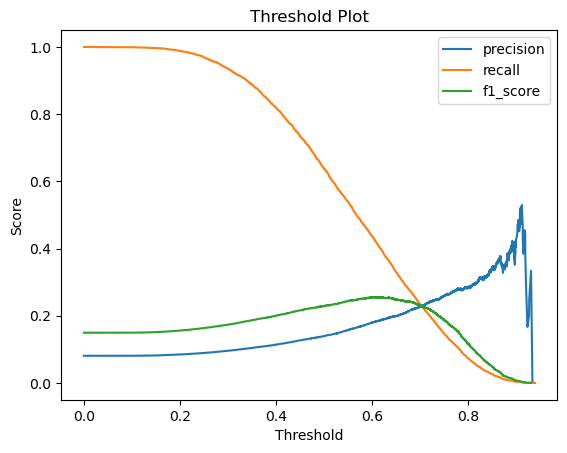

In [53]:
from sklearn.metrics import precision_recall_curve

# get predicted probabilities for the positive class
y_proba = model_lgopt.predict_proba(X_test)[:, 1]

# compute precision and recall for different probability thresholds
precision, recall, thresholds = precision_recall_curve(y_test, y_proba)

# plot precision-recall curve
plt.plot(recall, precision)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

# plot threshold plot
f1_score = 2 * (precision * recall) / (precision + recall)
plt.plot(thresholds, precision[:-1], label='precision')
plt.plot(thresholds, recall[:-1], label='recall')
plt.plot(thresholds, f1_score[:-1], label='f1_score')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.legend(loc='best')
plt.title('Threshold Plot')
plt.show()


### Summary for logisitic regression
The model seems to perform decently well, with a training accuracy of 65.6% and a testing accuracy of 65.3%. The precision and recall values are also quite similar between the training and testing sets, indicating that the model is not overfitting. The AUC scores for both the training and testing sets are quite good, indicating that the model has good discriminative power.

The top three variables in the logistic regression model are:

- NAME_INCOME_TYPE_Pensioner	
- ORGANIZATION_TYPE_XNA	
- EXT_SOURCE_3

These variables were found to be the most important predictors of the outcome variable based on the logistic regression model. Understanding the relative importance of these variables can help inform business decisions related to lead generation and conversion.

## Treed based model of XGBoost

In [17]:
from xgboost import XGBClassifier
from sklearn.metrics import f1_score

# define the pipeline

Model performance for:  XGBoost
train set accuracy: 0.921
train set precision: 0.886
train set recall: 0.021
train set f1 score: 0.040
training set AUC score: 0.788

test set accuracy: 0.919
test set precision: 0.505
test set recall: 0.010
test set f1 score: 0.020
test set AUC score: 0.710


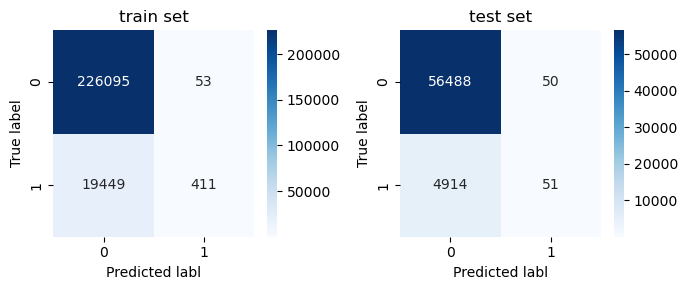

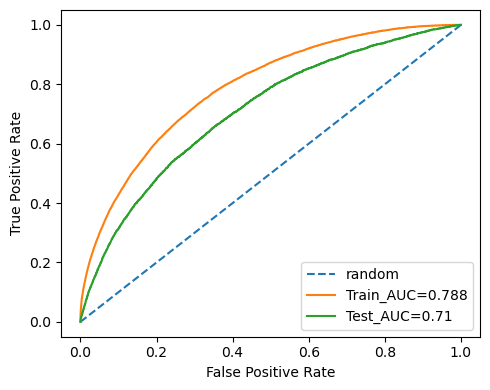

In [18]:
start = time.time()

steps=[("pre",preprocessor),        
       ("xgb", XGBClassifier(random_state=2023))]

xgb = Pipeline(steps)
model_xgb = xgb.fit(X_train, y_train)

# fit the pipeline to the training data
model_xgb = xgb.fit(X_train, y_train)

report_loss_cf('XGBoost', model_xgb, X_train, y_train, X_test, y_test, graph = 1)

In [40]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from scipy.stats import uniform
import time
start = time.time()

steps = [("pre", preprocessor),            
         ("Ensemble", XGBClassifier(random_state=2023))]

model = Pipeline(steps)

params = {'Ensemble__n_estimators' : np.arange(20,110,10),
          'Ensemble__max_depth': np.arange(2,12,2),
          'Ensemble__min_samples_split' : [2,4,6,8,10,20,40,60],
          'Ensemble__min_samples_leaf' : [1,5,10,20],
          'Ensemble__max_features': ['sqrt', 'log2'],
         }

model_xgb = RandomizedSearchCV(model,
                        params,
                        n_iter=50,
                        cv=5,
                        n_jobs=-1,
                        scoring='roc_auc')
model_xgb = model_xgb.fit(X_train, y_train)

end = time.time()

[17:49:28] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "max_features", "min_samples_leaf", "min_samples_split" } are not used.



In [41]:
best_params =model_xgb.best_params_
best_score = model_xgb.best_score_


In [42]:
print(best_params)
print(best_score)
print(f'This random search session took {(end-start)/60} minutes.')

{'Ensemble__n_estimators': 100, 'Ensemble__min_samples_split': 6, 'Ensemble__min_samples_leaf': 20, 'Ensemble__max_features': 'sqrt', 'Ensemble__max_depth': 2}
0.7097343861052999
This random search session took 23.412339866161346 minutes.


Model performance for:  XGBoost
train set accuracy: 0.919
train set precision: 0.700
train set recall: 0.001
train set f1 score: 0.003
training set AUC score: 0.717

test set accuracy: 0.919
test set precision: 0.500
test set recall: 0.002
test set f1 score: 0.003
test set AUC score: 0.717


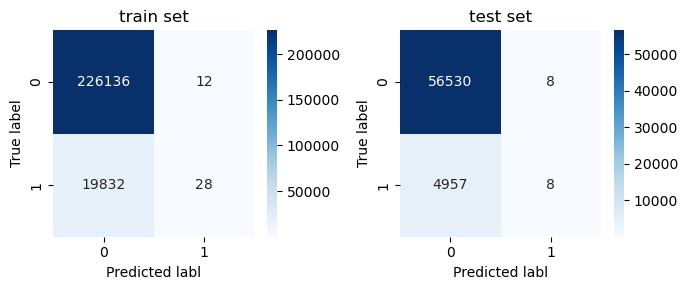

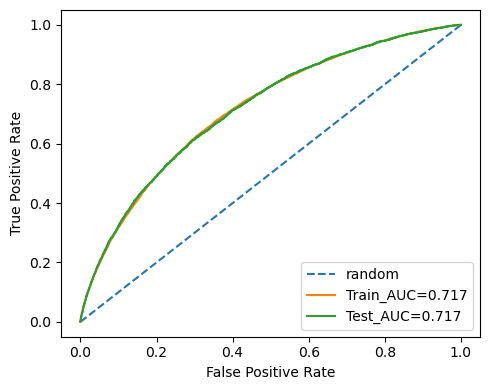

In [43]:
report_loss_cf('XGBoost', model_xgb, X_train, y_train, X_test, y_test, graph = 1)

## Treed based model of Random Forest

In [44]:
steps = [("pre", preprocessor),            
         ("Ensemble", RandomForestClassifier(class_weight='balanced',random_state = 77))]

model = Pipeline(steps)

params = {'Ensemble__n_estimators' : np.arange(20,110,10),
          'Ensemble__max_depth': np.arange(2,12,2),
          'Ensemble__min_samples_split' : [2,4,6,8,10,20,40,60],
          'Ensemble__min_samples_leaf' : [1,5,10,20],
          'Ensemble__max_features': ['sqrt', 'log2'],
         }

rs = RandomizedSearchCV(model,
                        params,
                        n_iter=50,
                        cv=5,
                        n_jobs=-1,
                        scoring='roc_auc')

rs.fit(X_train, y_train)

end = time.time()

In [45]:


print(model_xgb.best_params_)
print(model_xgb.best_score_)
print(f'This random search session took {(end-start)/60} minutes.')

{'Ensemble__n_estimators': 100, 'Ensemble__min_samples_split': 6, 'Ensemble__min_samples_leaf': 20, 'Ensemble__max_features': 'sqrt', 'Ensemble__max_depth': 2}
0.7097343861052999
This random search session took 40.77734083334605 minutes.


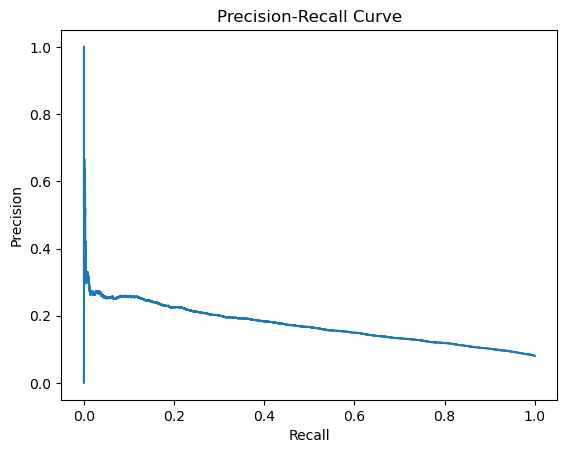

/var/folders/wh/vlvxydp55gz490wlfq6dfkvm0000gr/T/ipykernel_3041/840520618.py:17: RuntimeWarning: invalid value encountered in divide
  f1_score = 2 * (precision * recall) / (precision + recall)


Text(0.5, 1.0, 'Threshold')

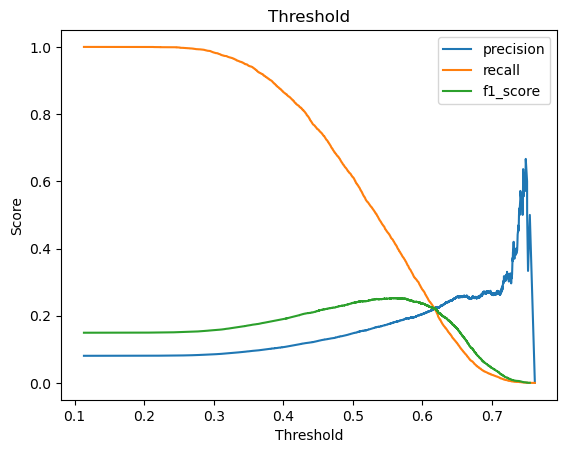

In [48]:
from sklearn.metrics import precision_recall_curve

# get predicted probabilities for the positive class
y_proba = rs.predict_proba(X_test)[:, 1]

# compute precision and recall for different probability thresholds
precision, recall, thresholds = precision_recall_curve(y_test, y_proba)

# plot precision-recall curve
plt.plot(recall, precision)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

# plot threshold plot
f1_score = 2 * (precision * recall) / (precision + recall)
plt.plot(thresholds, precision[:-1], label='precision')
plt.plot(thresholds, recall[:-1], label='recall')
plt.plot(thresholds, f1_score[:-1], label='f1_score')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.legend(loc='best')
plt.title('Threshold')

In [49]:
# Get the best model
steps = [("pre", preprocessor),            
         ("Ensemble", RandomForestClassifier(class_weight='balanced',
                                             n_estimators = 100, 
                                             min_samples_split = 2, 
                                             min_samples_leaf = 10,
                                             max_features = 'log2', 
                                             max_depth = 2,
                                             random_state = 2023))]

rf_opt = Pipeline(steps)
model_rfopt = rf_opt.fit(X_train, y_train)

Model performance for:  Random Forest
train set accuracy: 0.611
train set precision: 0.129
train set recall: 0.663
train set f1 score: 0.216
training set AUC score: 0.682

test set accuracy: 0.615
test set precision: 0.131
test set recall: 0.667
test set f1 score: 0.218
test set AUC score: 0.687


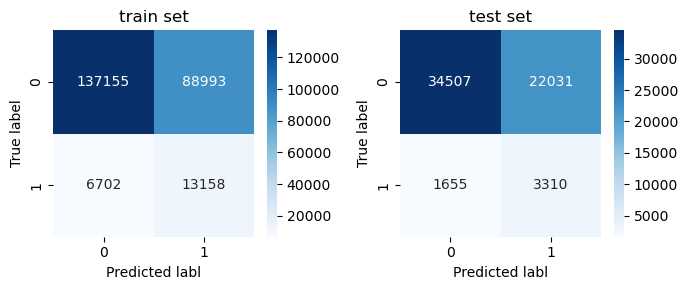

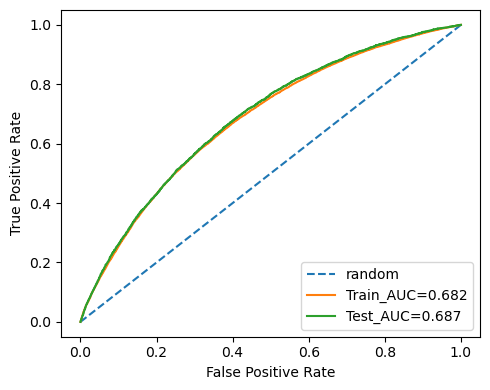

In [50]:
from sklearn.metrics import f1_score

report_loss_cf('Random Forest', model_rfopt, X_train, y_train, X_test, y_test, graph = 1)

  ### Form the profit - threshold curve to find the max profit.

In [52]:
y = df['TARGET']
X = df[cat_col_final + num_col_final].drop('TARGET', axis = 1)

In [53]:
X_profit = X.copy()
X_profit['AMT_CREDIT'] = df['AMT_CREDIT']

In [54]:
X_profit.columns

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'ORGANIZATION_TYPE', 'HOUSETYPE_MODE',
       'WALLSMATERIAL_MODE', 'REGION_POPULATION_RELATIVE', 'EXT_SOURCE_3',
       'DAYS_REGISTRATION', 'TOTALAREA_MODE', 'DAYS_LAST_PHONE_CHANGE',
       'AMT_REQ_CREDIT_BUREAU_YEAR', 'AMT_CREDIT'],
      dtype='object')

In [55]:
X_train, X_test_profit, y_train, y_test = train_test_split(X_profit, y, 
                                                    test_size = 0.2, 
                                                    stratify = y, 
                                                    random_state = 42
                                                   )

In [56]:
X_test = X_test_profit.copy().drop('AMT_CREDIT', axis = 1)

In [57]:
X_test.columns

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'ORGANIZATION_TYPE', 'HOUSETYPE_MODE',
       'WALLSMATERIAL_MODE', 'REGION_POPULATION_RELATIVE', 'EXT_SOURCE_3',
       'DAYS_REGISTRATION', 'TOTALAREA_MODE', 'DAYS_LAST_PHONE_CHANGE',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object')

In [58]:
X_test_profit.columns

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'ORGANIZATION_TYPE', 'HOUSETYPE_MODE',
       'WALLSMATERIAL_MODE', 'REGION_POPULATION_RELATIVE', 'EXT_SOURCE_3',
       'DAYS_REGISTRATION', 'TOTALAREA_MODE', 'DAYS_LAST_PHONE_CHANGE',
       'AMT_REQ_CREDIT_BUREAU_YEAR', 'AMT_CREDIT'],
      dtype='object')

Model performance for:  Logistic Regression
train set accuracy: 0.656
train set precision: 0.141
train set recall: 0.642
train set f1 score: 0.232
training set AUC score: 0.704

test set accuracy: 0.653
test set precision: 0.140
test set recall: 0.638
test set f1 score: 0.229
test set AUC score: 0.704


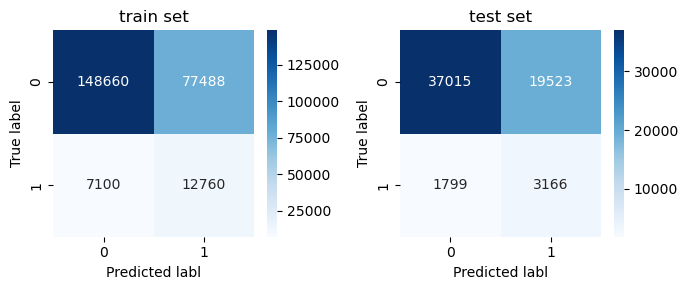

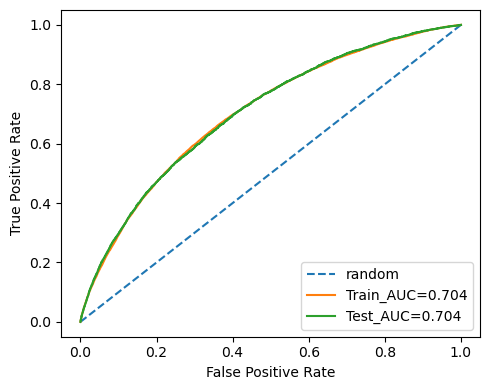

In [59]:
steps=[("pre",preprocessor),        
       ("lr", LogisticRegression(class_weight = 'balanced', penalty='l1', solver='liblinear', C=0.1))]

lg_opt = Pipeline(steps)
model_lgopt = lg_opt.fit(X_train, y_train)

report_loss_cf('Logistic Regression', model_lgopt, X_train, y_train, X_test, y_test, graph = 1)

In [60]:
X_test_profit["AMT_CREDIT"].iloc[0]

770292.0

In [61]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming you have already trained and fitted your logistic regression model


# Make predictions on the test data
y_pred_prob = model_lgopt.predict_proba(X_test)[:, 1]  # Probabilities of positive class

# Define an array of thresholds
thresholds = np.linspace(0, 1, 100)

profits = []
for threshold in thresholds:
    y_pred = (y_pred_prob >= threshold).astype(int)  # Convert probabilities to binary predictions
    
    # Calculate TP, FN, FP and profit for each customer
    profit = 0
    for i in range(len(X_test)):
        actual_status = y_test.iloc[i]
        predicted_status = y_pred[i]
        loan_amount = X_test_profit["AMT_CREDIT"].iloc[i]  # Assuming "AMT_Credit" is the column name for loan amount
        
        if actual_status == 0 and predicted_status == 0:
            profit += loan_amount * ((1 + 0.06837/12) ** (30*12) - (1 + 0.055/12) ** (30*12))
        elif actual_status == 1 and predicted_status == 0:
            profit -= loan_amount / 2
        elif actual_status == 0 and predicted_status == 1:
            profit -= loan_amount * ((1 + 0.06837/12) ** (30*12) - (1 + 0.055/12) ** (30*12))
        elif actual_status == 1 and predicted_status == 1:
            profit += loan_amount / 2
    
    profits.append(profit)

Text(0.9393939393939394, 85079715944.50887, 'Max Profit: 85079715944.50887')

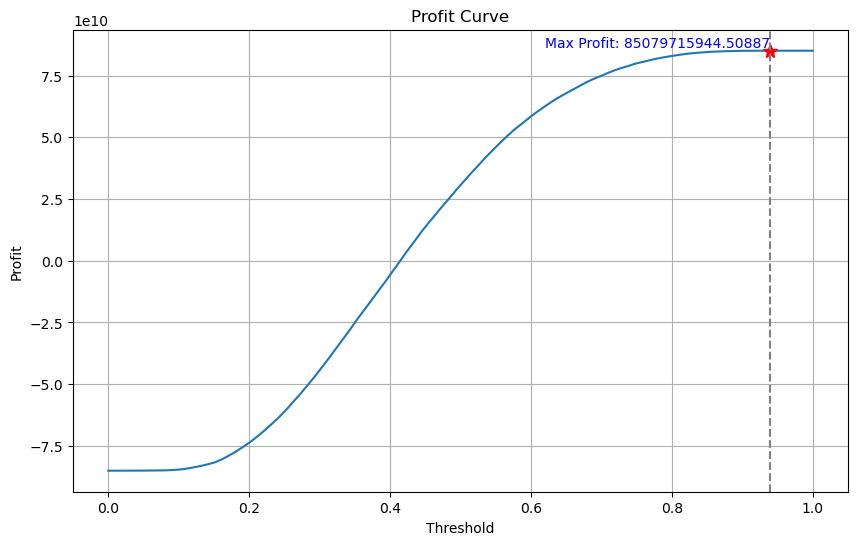

In [62]:
import seaborn as sns

# Plot the profit curve
plt.figure(figsize=(10, 6))
sns.lineplot(x=thresholds, y=profits)  # Specify x and y variables
plt.xlabel("Threshold")
plt.ylabel("Profit")
plt.title("Profit Curve")
plt.grid(True)

# Find the index of the maximum profit
max_profit_index = np.argmax(profits)
max_profit_threshold = thresholds[max_profit_index]
max_profit = profits[max_profit_index]

# Mark the peak as 'Max Profit' using a star symbol
plt.plot(max_profit_threshold, max_profit, marker='*', markersize=10, color='red')
plt.axvline(x=max_profit_threshold, color='gray', linestyle='--')
plt.text(max_profit_threshold, max_profit, f"Max Profit: {max_profit}", 
         va='bottom', ha='right', color='blue')

Text(0.8585858585858587, 2021624953.1229675, 'Max Profit: 2021624953.1229675')

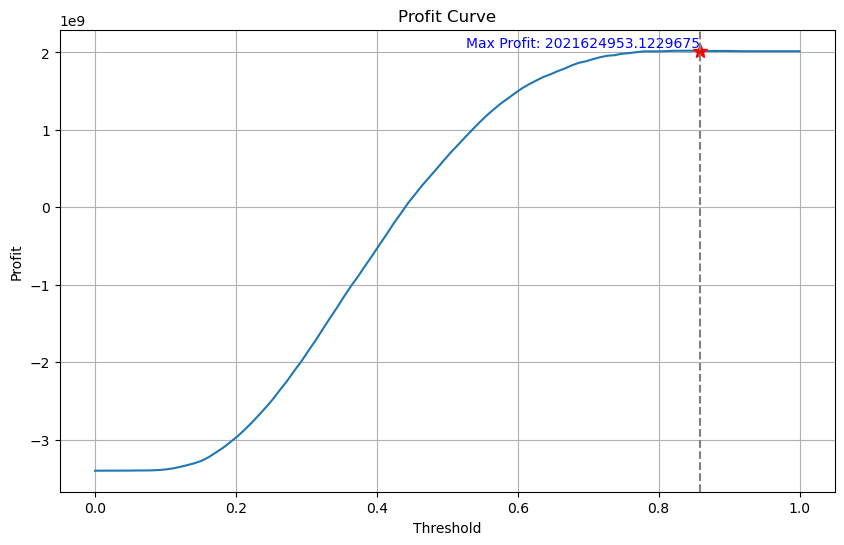

In [63]:
profits = []
for threshold in thresholds:
    y_pred = (y_pred_prob >= threshold).astype(int)  # Convert probabilities to binary predictions
    
    # Calculate TP, FN, FP and profit for each customer
    profit = 0
    for i in range(len(X_test)):
        actual_status = y_test.iloc[i]
        predicted_status = y_pred[i]
        loan_amount = X_test_profit["AMT_CREDIT"].iloc[i]  # Assuming "AMT_Credit" is the column name for loan amount
        
        if actual_status == 0 and predicted_status == 0:
            profit += loan_amount * ((1 + 0.006837/12) ** (30*12) - (1 + 0.004/12) ** (30*12))
        elif actual_status == 1 and predicted_status == 0:
            profit -= loan_amount / 2
        elif actual_status == 0 and predicted_status == 1:
            profit -= loan_amount * ((1 + 0.006837/12) ** (30*12) - (1 + 0.004/12) ** (30*12))
        
    profits.append(profit)
    

# Plot the profit curve
plt.figure(figsize=(10, 6))
sns.lineplot(x=thresholds, y=profits)  # Specify x and y variables
plt.xlabel("Threshold")
plt.ylabel("Profit")
plt.title("Profit Curve")
plt.grid(True)

# Find the index of the maximum profit
max_profit_index = np.argmax(profits)
max_profit_threshold = thresholds[max_profit_index]
max_profit = profits[max_profit_index]

# Mark the peak as 'Max Profit' using a star symbol
plt.plot(max_profit_threshold, max_profit, marker='*', markersize=10, color='red')
plt.axvline(x=max_profit_threshold, color='gray', linestyle='--')
plt.text(max_profit_threshold, max_profit, f"Max Profit: {max_profit}", 
         va='bottom', ha='right', color='blue')

Text(0.9393939393939394, 85079715944.50887, 'Max Profit: 85079715944.50887')

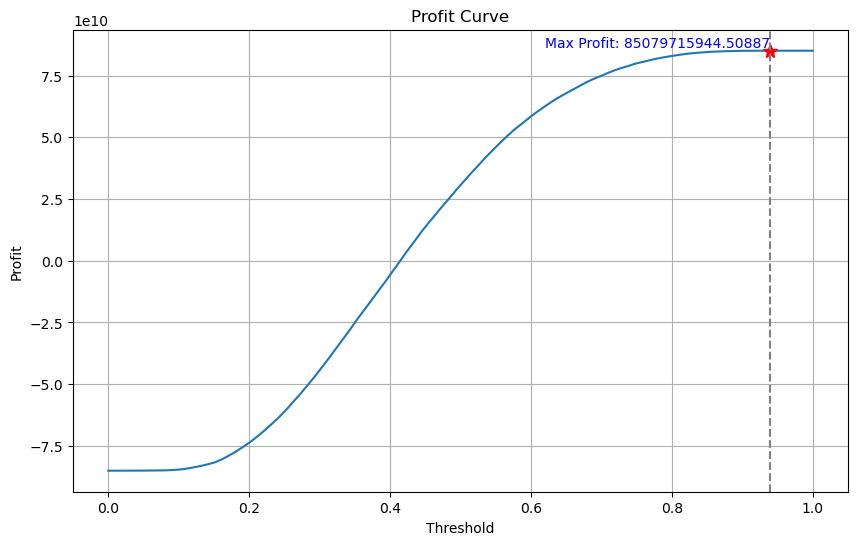

In [64]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming you have already trained and fitted your logistic regression model


# Make predictions on the test data
y_pred_prob = model_lgopt.predict_proba(X_test)[:, 1]  # Probabilities of positive class

# Define an array of thresholds
thresholds = np.linspace(0, 1, 100)

profits = []
for threshold in thresholds:
    y_pred = (y_pred_prob >= threshold).astype(int)  # Convert probabilities to binary predictions
    
    # Calculate TP, FN, FP and profit for each customer
    profit = 0
    for i in range(len(X_test)):
        actual_status = y_test.iloc[i]
        predicted_status = y_pred[i]
        loan_amount = X_test_profit["AMT_CREDIT"].iloc[i]  # Assuming "AMT_Credit" is the column name for loan amount
        
        if actual_status == 0 and predicted_status == 0:
            profit += loan_amount * ((1 + 0.06837/12) ** (30*12) - (1 + 0.055/12) ** (30*12))
        elif actual_status == 1 and predicted_status == 0:
            profit -= loan_amount / 2
        elif actual_status == 0 and predicted_status == 1:
            profit -= loan_amount * ((1 + 0.06837/12) ** (30*12) - (1 + 0.055/12) ** (30*12))
        elif actual_status == 1 and predicted_status == 1:
            profit += loan_amount / 2
    
    profits.append(profit)
import seaborn as sns

# Plot the profit curve
plt.figure(figsize=(10, 6))
sns.lineplot(x=thresholds, y=profits)  # Specify x and y variables
plt.xlabel("Threshold")
plt.ylabel("Profit")
plt.title("Profit Curve")
plt.grid(True)

# Find the index of the maximum profit
max_profit_index = np.argmax(profits)
max_profit_threshold = thresholds[max_profit_index]
max_profit = profits[max_profit_index]

# Mark the peak as 'Max Profit' using a star symbol
plt.plot(max_profit_threshold, max_profit, marker='*', markersize=10, color='red')
plt.axvline(x=max_profit_threshold, color='gray', linestyle='--')
plt.text(max_profit_threshold, max_profit, f"Max Profit: {max_profit}", 
         va='bottom', ha='right', color='blue')

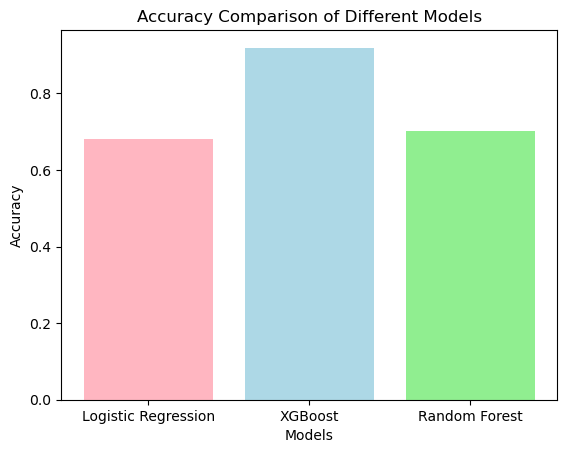

In [66]:
import matplotlib.pyplot as plt

models = ['Logistic Regression', 'XGBoost', 'Random Forest']
accuracies = [0.681, 0.919, 0.702]
colors = ['lightpink', 'lightblue', 'lightgreen']

plt.bar(models, accuracies, color=colors)
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison of Different Models')

plt.show()


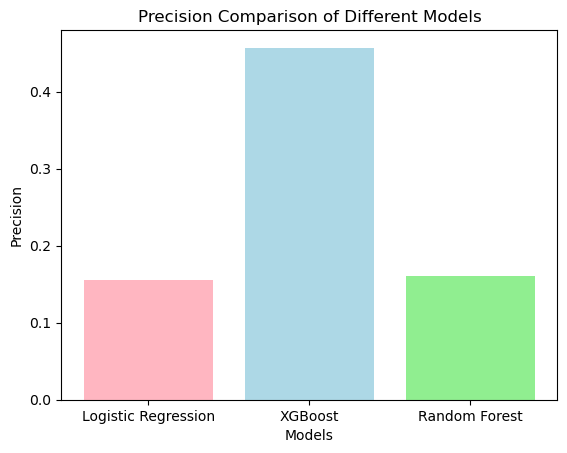

In [67]:
import matplotlib.pyplot as plt

models = ['Logistic Regression', 'XGBoost', 'Random Forest']
precisions = [0.155, 0.457, 0.161]
colors = ['lightpink', 'lightblue', 'lightgreen']

plt.bar(models, precisions, color=colors)
plt.xlabel('Models')
plt.ylabel('Precision')
plt.title('Precision Comparison of Different Models')

plt.show()


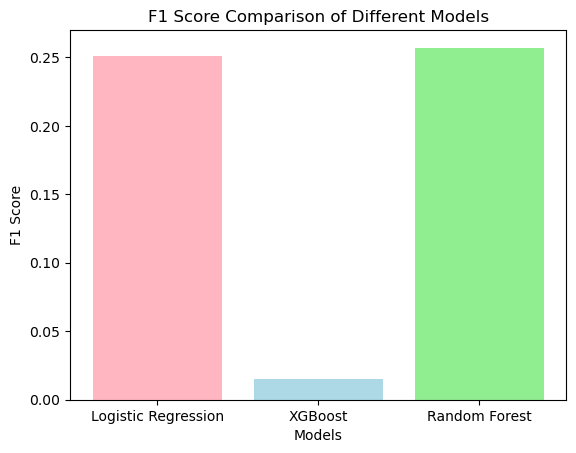

In [68]:
import matplotlib.pyplot as plt

models = ['Logistic Regression', 'XGBoost', 'Random Forest']
f1_scores = [0.251, 0.015, 0.257]
colors = ['lightpink', 'lightblue', 'lightgreen']

plt.bar(models, f1_scores, color=colors)
plt.xlabel('Models')
plt.ylabel('F1 Score')
plt.title('F1 Score Comparison of Different Models')

plt.show()


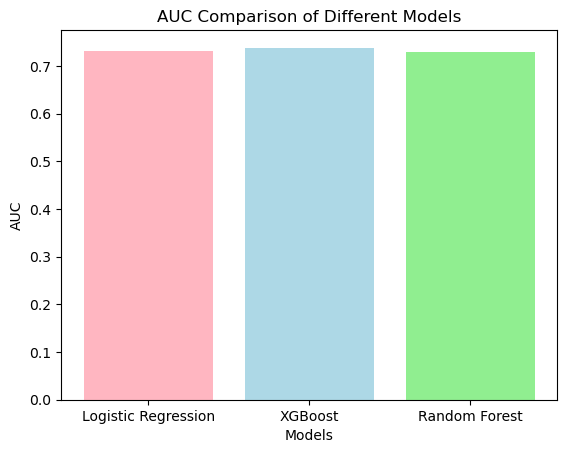

In [69]:
import matplotlib.pyplot as plt

models = ['Logistic Regression', 'XGBoost', 'Random Forest']
auc_values = [0.732, 0.738, 0.730]
colors = ['lightpink', 'lightblue', 'lightgreen']

plt.bar(models, auc_values, color=colors)
plt.xlabel('Models')
plt.ylabel('AUC')
plt.title('AUC Comparison of Different Models')

plt.show()
